# Reconstruction Analysis True Hits (RATH) : Analysis 
- Analysis of the output of the Reconstruction Analysis for True hits (RATH).
- Loads from disk
- Plot Statistics
- GraphTracks manipulation
    - GraphTracks are constructed from the EventTrack object, and are used to define blobs and find blob energy. 
- Visualisation of events where single and multiple tracks where reconstructed in $\beta\beta0\nu$ events.

## Voxel bin = 2, contiguity =10

##### General

In [2]:
from IPython.core.display import HTML
css = open('style-table.css').read() + open('style-notebook.css').read()
HTML('<style>{}</style>'.format(css))

In [3]:
# General importings
import os
import sys
import glob
import logging
import math
import numpy  as np
import warnings
import functools
import time

from scipy.stats import norm
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colors
from mpl_toolkits.mplot3d import Axes3D 
import networkx as nx
from itertools   import combinations

In [4]:
from pandas import DataFrame, Series
from typing import List, Tuple
from typing import Union
from   dataclasses import dataclass

In [241]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
plt.rcParams["figure.figsize"] = 8, 6
plt.rcParams["font.size"     ] = 14

##### IC

In [7]:

import invisible_cities.core.system_of_units  as units

from invisible_cities.io.mcinfo_io import load_mcconfiguration
from invisible_cities.io.mcinfo_io import load_mcparticles_df
from invisible_cities.io.mcinfo_io import load_mchits_df
from invisible_cities.io.mcinfo_io import load_mcsensor_positions
from invisible_cities.io.mcinfo_io import load_mcsensor_response_df
from invisible_cities.io.mcinfo_io import get_sensor_types
from invisible_cities.io.mcinfo_io import get_sensor_binning
from invisible_cities.io.mcinfo_io import get_event_numbers_in_file
from invisible_cities.core.core_functions import in_range


##### TICs

In [184]:
from tics.histograms    import h1
from tics.pd_tics       import get_index_slice_from_multi_index
from tics.pd_tics   import slice_and_select_df
from tics.graphics_reco import plot_hits3d
from tics.stats_tics    import bin_data_with_equal_bin_size
from tics.util_tics import get_class_name
from tics.util_tics import Range
from tics.graphics_reco import plot_gtrack
from tics.graphics_reco import sphere
from tics.system_of_units import *

##### NetFlex

In [9]:
from nextflex.core import Setup

In [10]:
from nextflex.core import Setup
from nextflex.mctrue_functions import get_mc_particles
from nextflex.mctrue_functions import get_mc_primary_particles
from nextflex.mctrue_functions import get_mc_vertex
from nextflex.mctrue_functions import select_mc_particles
from nextflex.mctrue_functions import get_mc_hits
from nextflex.mctrue_functions import select_mc_hits
from nextflex.mctrue_functions import total_hit_energy
from nextflex.mctrue_functions import get_event_hits_from_mchits

In [11]:
from nextflex.reco_functions import voxelize_hits
from nextflex.reco_functions import get_voxels_as_list
from nextflex.reco_functions import voxel_position
from nextflex.reco_functions import voxel_energy
from nextflex.reco_functions import voxel_nhits
from nextflex.reco_functions import distance_between_two_voxels
from nextflex.reco_functions import voxel_distances
from nextflex.reco_functions import voxel_distance_pairs
from nextflex.reco_functions import make_track_graphs
from nextflex.reco_functions import gtrack_voxels
from nextflex.reco_functions import shortest_paths
from nextflex.reco_functions import find_extrema_and_length
from nextflex.reco_functions import GTrack
from nextflex.reco_functions import GTracks
from nextflex.reco_functions import voxels_in_blob
from nextflex.reco_functions import blob_energy


In [12]:
from nextflex.io import write_event_gtracks_json
from nextflex.io import load_event_gtracks_json
from nextflex.io import save_to_JSON
from nextflex.io import load_from_JSON

In [13]:
from nextflex.reco_analysis import reco_gtrack_from_mc_hits
from nextflex.reco_analysis import reco_gtrack_blobs
from nextflex.reco_analysis import TrackRecoStats
from nextflex.reco_analysis import TrackRecoTiming
from nextflex.reco_analysis import TrackRecoEventStats
from nextflex.reco_analysis import GtrkStats
from nextflex.reco_analysis import gtrack_summary
from nextflex.reco_analysis import select_gtrack_topology
from nextflex.reco_analysis import distance_between_extrema
from nextflex.reco_analysis import gtrack_df
from nextflex.reco_analysis import event_list_by_multiplicity
from nextflex.reco_analysis import tExtrema_df
from nextflex.reco_analysis import RecoGtrackFromMcHits

In [14]:
from nextflex.analysis_histos import reco_gtrack_stats_histos
from nextflex.analysis_histos import reco_gtrack_timing_histos
from nextflex.analysis_histos import reco_gtrack_blobs_histos
from nextflex.analysis_histos import plot_complexity
from nextflex.analysis_graphics import plot_single_tracks_list
from nextflex.analysis_graphics import plot_multiple_tracks_list

In [15]:
from nextflex.types import EventHits
from nextflex.types import VoxelHits


In [16]:
from nextflex.analysis_blobs import blob_energy
from nextflex.analysis_blobs import select_topology_and_energy
from nextflex.analysis_blobs import select_blobs_eff_energy
from nextflex.analysis_blobs import select_blobs
from nextflex.analysis_blobs import energy_resolution
from nextflex.analysis_blobs import selection_efficiency
from nextflex.analysis_blobs import distance_reco_true
from nextflex.analysis_blobs import d12_eff

from nextflex.analysis_blobs import select_distance_cut
from nextflex.analysis_blobs import select_energy
from nextflex.analysis_blobs import select_energy
from nextflex.analysis_blobs import select_two_blobs

In [160]:
from nextflex.analysis_graphics import plot_single_tracks_list
from nextflex.analysis_graphics import plot_multiple_tracks_list
from nextflex.analysis_graphics import single_track_interactive_analysis

## Input data

In [18]:
FDATA = os.environ['FLEXDATA']

##### bb0nu

In [19]:
setbb = Setup(flexDATA = FDATA,
              tpConfig = "FLEX100_M6_O6.EL8bar.bb0nu")
print(setbb)


        Setup <FLEX100_M6_O6.EL8bar.bb0nu_PMTs_sipmPDE_1.0_maskPDE_1.0_qTh_0.0>:
        tracking plane configuration = FLEX100_M6_O6.EL8bar.bb0nu
        sipm PDE                     = 1.0
        transmission of teflon masks = 1.0
        charge threshold             = 0.0
        energy sensors               = PMTs
        pitch                        = 15.55
        number of energy sensors     = 60
        number of SiPMs              = 3093
        root directory               = /Users/jj/Development/flexdata/FLEX100_M6_O6.EL8bar.bb0nu
        analysis directory           = /Users/jj/Development/flexdata/analysis/FLEX100_M6_O6.EL8bar.bb0nu
        number of h5 files in dir    = 621
        sipm map at                  = /Users/jj/Development/flexdata/flexmaps/sipm_map_15.6_mm.csv
        sipm map name                = sipm_map_15.6_mm.csv
        output file                  = /Users/jj/Development/flexdata/kdsts/FLEX100_M6_O6.EL8bar.bb0nu_PMTs_sipmPDE_1.0_maskPDE_1.0_qTh_0.0.cs

##### single electrons

In [20]:
set1e = Setup(flexDATA = FDATA,
              tpConfig = "FLEX100_M6_O6.EL8bar.1e")
print(set1e)


        Setup <FLEX100_M6_O6.EL8bar.1e_PMTs_sipmPDE_1.0_maskPDE_1.0_qTh_0.0>:
        tracking plane configuration = FLEX100_M6_O6.EL8bar.1e
        sipm PDE                     = 1.0
        transmission of teflon masks = 1.0
        charge threshold             = 0.0
        energy sensors               = PMTs
        pitch                        = 15.55
        number of energy sensors     = 60
        number of SiPMs              = 3093
        root directory               = /Users/jj/Development/flexdata/FLEX100_M6_O6.EL8bar.1e
        analysis directory           = /Users/jj/Development/flexdata/analysis/FLEX100_M6_O6.EL8bar.1e
        number of h5 files in dir    = 613
        sipm map at                  = /Users/jj/Development/flexdata/flexmaps/sipm_map_15.6_mm.csv
        sipm map name                = sipm_map_15.6_mm.csv
        output file                  = /Users/jj/Development/flexdata/kdsts/FLEX100_M6_O6.EL8bar.1e_PMTs_sipmPDE_1.0_maskPDE_1.0_qTh_0.0.csv
        


## Analysis

In [242]:
voxel_bin  = 2
contiguity = 10

### Create a new instance and load from disk

In [243]:
rbb = RecoGtrackFromMcHits(setbb, voxel_bin, contiguity)
rbb.load_setup()

In [244]:
r1e = RecoGtrackFromMcHits(set1e, voxel_bin, contiguity)
r1e.load_setup()

### Statistics

#### Reco Event Statistics

##### bb

In [245]:
rbb.trackRecoEventStats


        <Track Reconstruction Statistics>
        size of voxel bins          = 2
        contiguity parameter        = 10
        topology                    = all
        event type                  = bb0nu
        voxels from hits barycenter = True
        number of files analyzed    = 620
        number of events analyized  = 2668
        number of events 1 GT       = 1761
        

##### 1e

In [246]:
r1e.trackRecoEventStats


        <Track Reconstruction Statistics>
        size of voxel bins          = 2
        contiguity parameter        = 10
        topology                    = all
        event type                  = 1e
        voxels from hits barycenter = True
        number of files analyzed    = 612
        number of events analyized  = 2492
        number of events 1 GT       = 1651
        

In [247]:
total_events_bb = rbb.trackRecoEventStats.e_total
total_events_1e = r1e.trackRecoEventStats.e_total
single_track_bb = rbb.trackRecoEventStats.e_gt
single_track_1e = r1e.trackRecoEventStats.e_gt
single_track_eff_bb = single_track_bb / total_events_bb
single_track_eff_1e = single_track_1e / total_events_1e

print(f"""
total events bb = {total_events_bb}, total events 1e = {total_events_1e}
single track bb = {single_track_bb}, single track 1e = {single_track_1e}
single track eff bb = {single_track_eff_bb:5.2f} 
single track eff 1e = {single_track_eff_1e:5.2f}
""")


total events bb = 2668, total events 1e = 2492
single track bb = 1761, single track 1e = 1651
single track eff bb =  0.66 
single track eff 1e =  0.66



#### Complexity

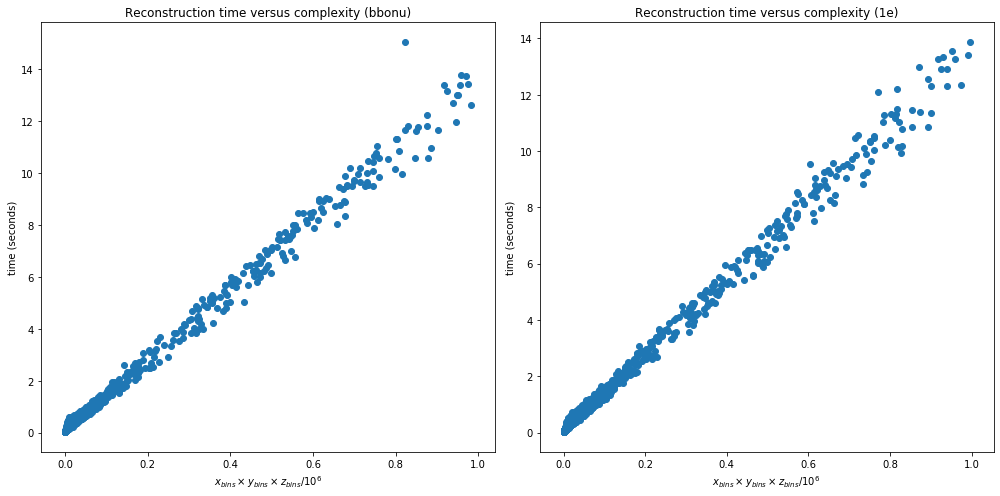

In [248]:
plot_complexity(rbb, r1e, figsize=(14,7))

#### Reco GTracks

##### bb0nu

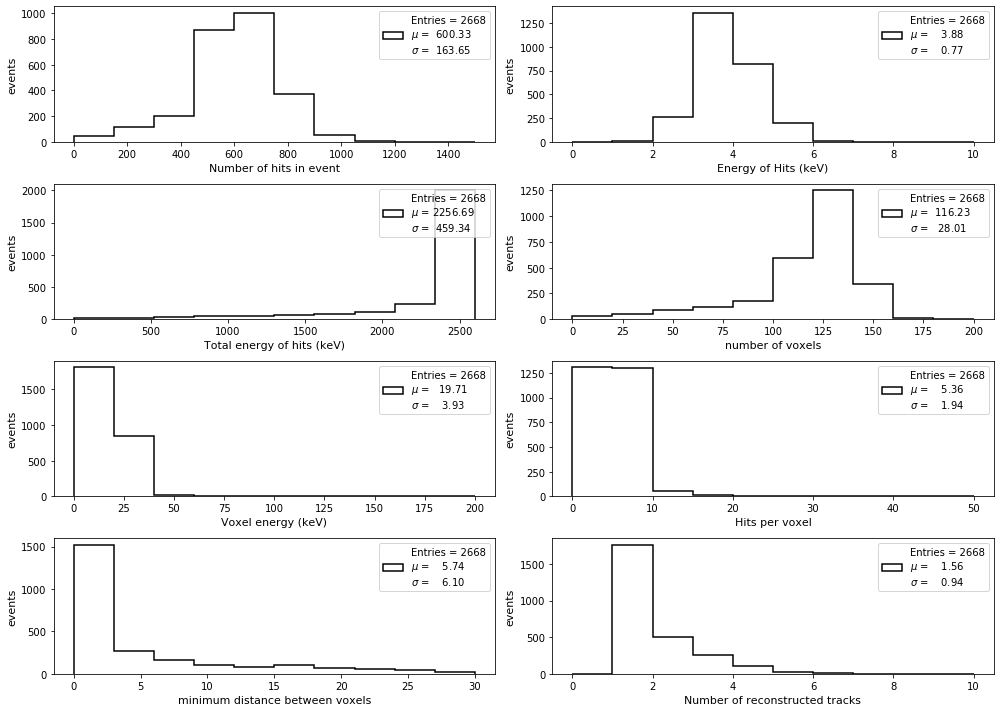

In [249]:
reco_gtrack_stats_histos(rbb.trackRecoStats, 
                         energy_evt_hits = (0,10),  
                         n_voxels        = (0,200),
                         energy_voxels   = (0,200),
                         n_hits_voxels   = (0,50),
                         min_dist_voxels = (0,30),
                         figsize=(14,10))

##### 1e

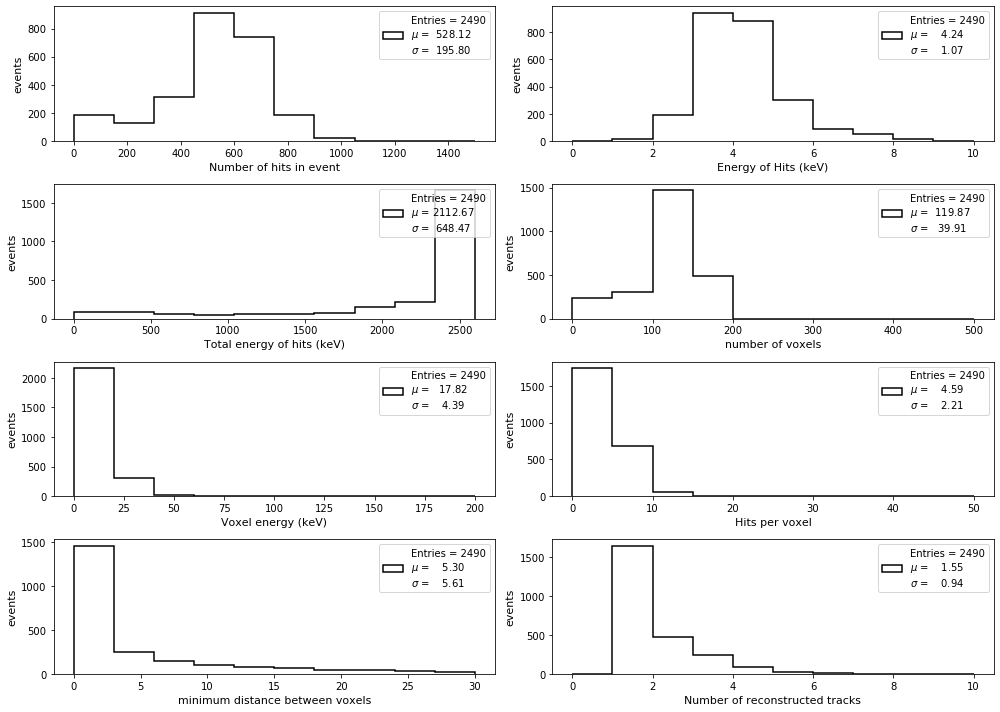

In [254]:
reco_gtrack_stats_histos(r1e.trackRecoStats, 
                         energy_evt_hits = (0,10),  
                         n_voxels        = (0,500),
                         energy_voxels   = (0,200),
                         n_hits_voxels   = (0,50),
                         min_dist_voxels = (0,30),
                         figsize=(14,10))

- Notice that the number of reconstructed tracks in bb0nu and single electrons have the same distributions (in fact all distributions are very similar) which shows that selecting more than one track does not help (increases signal and background in the same proportion)

#### Timing

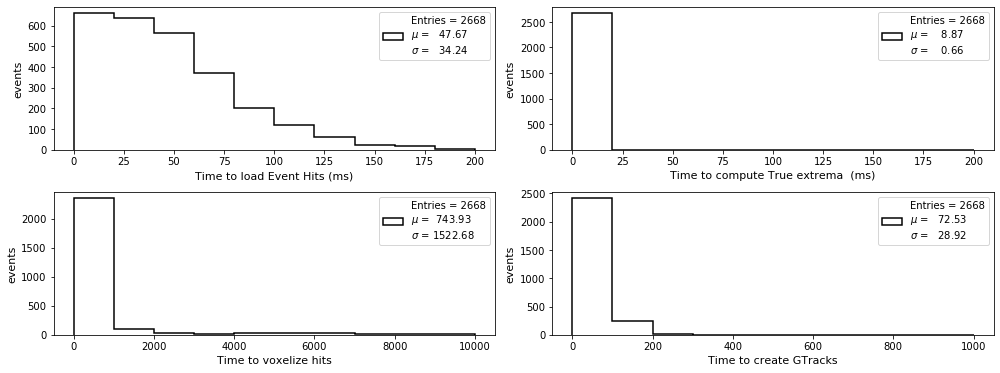

In [255]:
reco_gtrack_timing_histos(rbb.trackRecoTiming, 
                          t_voxelize_hits  = (0,10000),
                          t_graph_tracks  = (0,1000),
                          figsize=(14,10))

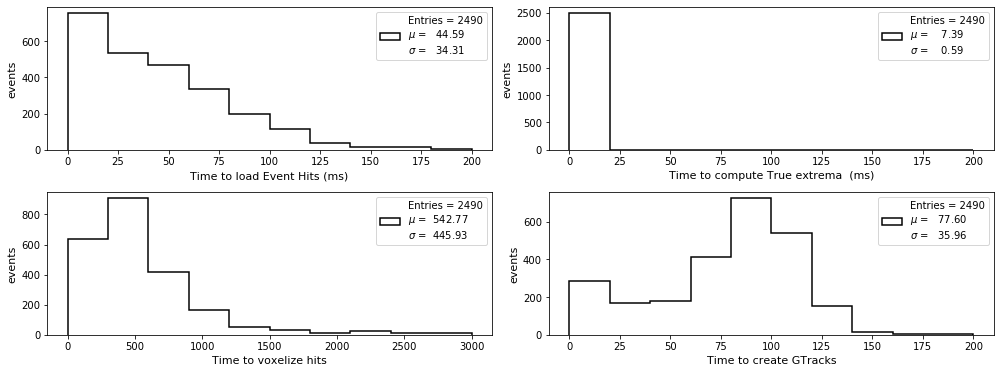

In [256]:
reco_gtrack_timing_histos(r1e.trackRecoTiming, 
                          t_voxelize_hits  = (0,3000),
                          figsize=(14,10))

Reconstructing single electrons takes a bit longer (81 ms vs 71 ms) than reconstructing bb0nu which suggests that electron tracks may be a bit longer (less convoluted than bb0nu double electrons)

### Single tracks

In [258]:
total_events_bb = rbb.trackRecoEventStats.e_total
total_events_1e = r1e.trackRecoEventStats.e_total

print(f"total events bb = {total_events_bb}")
print(f"total events 1e = {total_events_1e}")

total events bb = 2668
total events 1e = 2492


In [261]:
len(rbb.gtracks[0])

4

In [267]:
rbbst = [gt_event for gt_event in rbb.gtracks if len(gt_event) == 1]
r1est = [gt_event for gt_event in r1e.gtracks if len(gt_event) == 1]

In [268]:
st_events_bb = len(rbbst)
st_events_1e = len(r1est)
st_eff_bb    = st_events_bb / total_events_bb
st_eff_1e    = st_events_1e / total_events_1e

print(f" events bb st (single track ) = {st_events_bb}")
print(f" events 1e st                 = {st_events_1e}")
print(f" single track eff bb          = {st_eff_bb}")
print(f" single track eff 1e          = {st_eff_1e}")

 events bb st (single track ) = 1761
 events 1e st                 = 1651
 single track eff bb          = 0.6600449775112444
 single track eff 1e          = 0.6625200642054575


### Interactive analysis 

In [284]:
rb = np.linspace(2.5, 20.5, 10)

In [285]:
rb

array([ 2.5,  4.5,  6.5,  8.5, 10.5, 12.5, 14.5, 16.5, 18.5, 20.5])

event id  = 213, energy = 2439.16 keV

        Reconstructed extrema:
        e1 = (-227.18605105508388, 278.96649979646423, 648.9651126365881) in mm
        e2 = (-242.1524765515896, 283.22997996671717, 717.4393113669935) in mm
        True extrema:
        t1 = [-227.31655884  279.18347168  648.78668213] in mm
        t2 = [-233.38461304  269.77822876  709.34716797] in mm
        Distance true-reco:
        d1 =   0.3     in mm
        d2 =  18.0     in mm
        Energy blobs:
        eb1 = [46.66070081293583, 71.7931748367846, 90.97089618444443, 151.64892189204693, 170.23533210158348, 254.50462847948074, 388.1241353228688, 523.3982955105603, 617.7909136749804, 866.0261416807771] keV
        eb2 = [140.44293574988842, 248.27870540320873, 267.1833299100399, 321.9838887453079, 332.97794684767723, 349.8514275997877, 362.3305894434452, 369.4657734595239, 404.1971839033067, 417.8444924764335] keV
        


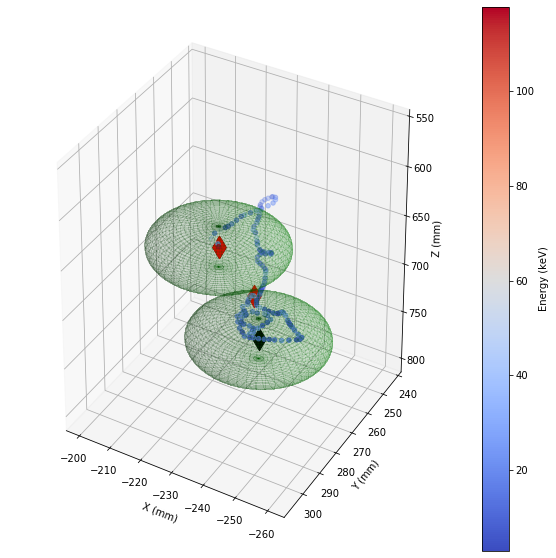

event id  = 214, energy = 2437.59 keV

        Reconstructed extrema:
        e1 = (-140.95742797851562, -68.06306457519531, 104.65027618408203) in mm
        e2 = (-115.51198697996996, -46.862341233768134, 63.922070399259944) in mm
        True extrema:
        t1 = [-140.50587463  -67.94478607  101.53165436] in mm
        t2 = [-115.28289032  -46.68539429   63.92531967] in mm
        Distance true-reco:
        d1 =   3.2     in mm
        d2 =   0.3     in mm
        Energy blobs:
        eb1 = [248.20743314921856, 548.5147554427385, 569.498598575592, 576.8174091354012, 594.6333734318614, 607.3718508705497, 639.8592758923769, 661.3995656371117, 675.8341738022864, 690.671004820615] keV
        eb2 = [65.38193393498659, 83.12647510319948, 89.01669457554817, 115.76574528589845, 146.2283548898995, 151.2910034507513, 183.03289450705051, 199.0981139242649, 207.47938007116318, 221.47291479632258] keV
        


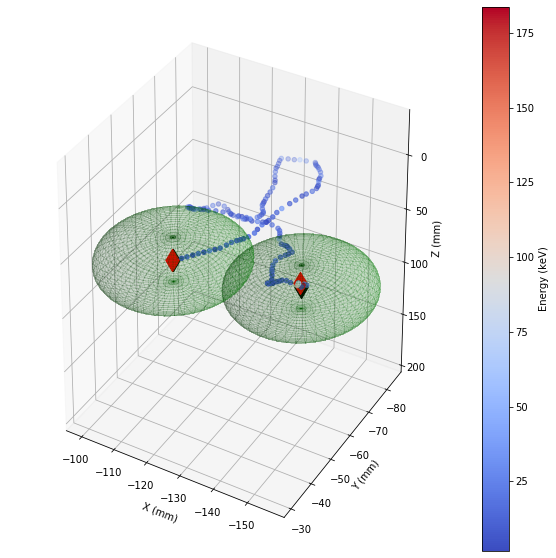

event id  = 215, energy = 2438.89 keV

        Reconstructed extrema:
        e1 = (-333.2556751106549, -315.5614437817454, 1046.9154698131206) in mm
        e2 = (-363.21091938663596, -287.01942495654805, 1076.9052383216701) in mm
        True extrema:
        t1 = [-333.07601929 -321.04690552 1052.43005371] in mm
        t2 = [-351.85073853 -301.66876221 1087.98913574] in mm
        Distance true-reco:
        d1 =   7.8     in mm
        d2 =  21.6     in mm
        Energy blobs:
        eb1 = [36.30795329809189, 110.2357991039753, 139.78525437414646, 218.04139367304742, 247.94999067671597, 279.0794519241899, 303.1350092496723, 326.67189999483526, 402.0761677529663, 441.29765522666276] keV
        eb2 = [47.37820103764534, 66.25003111548722, 82.38225127570331, 401.6090154182166, 587.4796831049025, 665.0388794951141, 928.2586383633316, 989.7501394152641, 1043.946455232799, 1052.6531115174294] keV
        


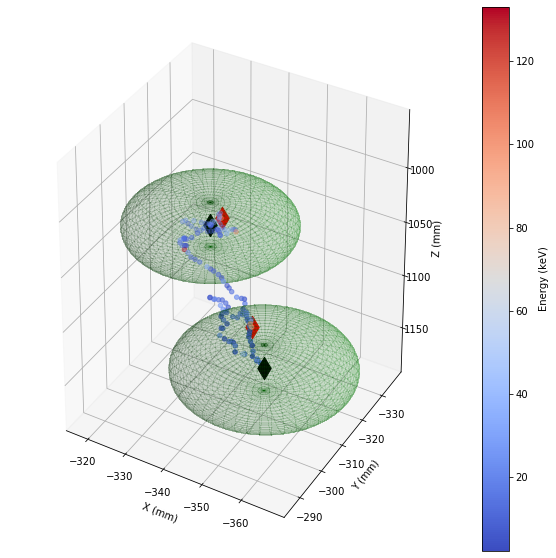

event id  = 172, energy = 2435.03 keV

        Reconstructed extrema:
        e1 = (-214.88052754572686, -344.50674745910135, 530.3759739616468) in mm
        e2 = (-186.84640873661655, -325.9237401125496, 553.5613095592713) in mm
        True extrema:
        t1 = [-215.05078125 -343.99438477  530.15179443] in mm
        t2 = [-183.24700928 -327.42150879  563.8392334 ] in mm
        Distance true-reco:
        d1 =   0.6     in mm
        d2 =  11.0     in mm
        Energy blobs:
        eb1 = [226.92264895886183, 265.7300066202879, 303.91343869268894, 314.88116830587387, 325.8528895676136, 345.7436701282859, 441.51228573173285, 510.93369093723595, 524.7117236722261, 543.0985579732805] keV
        eb2 = [35.87190085090697, 70.25356334634125, 116.84862175025046, 153.97853800095618, 180.90567784383893, 426.3593447394669, 587.8810347057879, 1006.1671598814428, 1031.4510720781982, 1046.7585059814155] keV
        


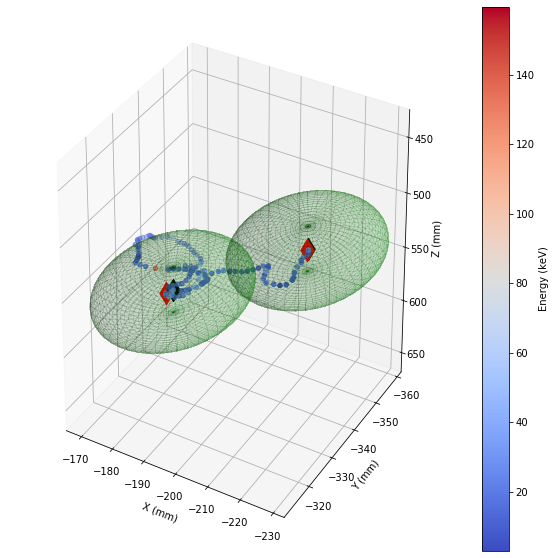

event id  = 173, energy = 2440.79 keV

        Reconstructed extrema:
        e1 = (166.8915582883579, 102.71434385987673, 538.7111330775302) in mm
        e2 = (175.4363581897659, 158.7782222658432, 475.3414603229741) in mm
        True extrema:
        t1 = [166.92436218 102.70442963 538.93029785] in mm
        t2 = [177.21934509 158.90208435 474.25280762] in mm
        Distance true-reco:
        d1 =   0.2     in mm
        d2 =   2.1     in mm
        Energy blobs:
        eb1 = [193.62399727106094, 354.1235513985157, 411.0425543040037, 441.49872101843357, 453.537555411458, 477.1638698875904, 490.6672276556492, 538.1698496639729, 631.8131615407765, 645.1271143741906] keV
        eb2 = [244.83700469136238, 272.2907494753599, 277.1010613068938, 427.03018616884947, 468.796418979764, 488.21285692974925, 639.7122857160866, 733.1159748136997, 964.6286088973284, 973.9482998847961] keV
        


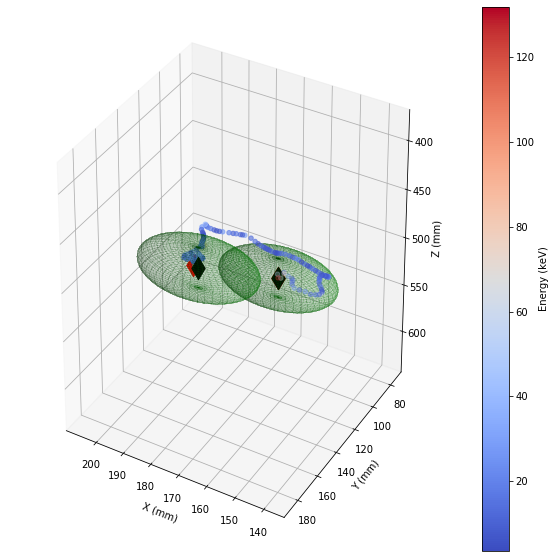

event id  = 174, energy = 2437.47 keV

        Reconstructed extrema:
        e1 = (152.61014418072892, 120.30424221539876, 733.4724312767906) in mm
        e2 = (242.57086987870798, 141.08186601538725, 726.2787870172219) in mm
        True extrema:
        t1 = [152.74171448 120.3971405  733.52459717] in mm
        t2 = [238.13180542 146.53588867 728.65368652] in mm
        Distance true-reco:
        d1 =   0.2     in mm
        d2 =   7.4     in mm
        Energy blobs:
        eb1 = [110.75114086270332, 149.6649757027626, 248.29729739576578, 264.08174354583025, 301.41754541546106, 312.71887477487326, 319.68997744843364, 343.08270597830415, 350.3869450651109, 362.4976370483637] keV
        eb2 = [81.12052408978343, 229.62279128842056, 370.6772911828011, 606.9009143393487, 623.4426524024457, 643.2519371155649, 664.546504849568, 697.4227766040713, 701.6412366647273, 746.5820026118308] keV
        


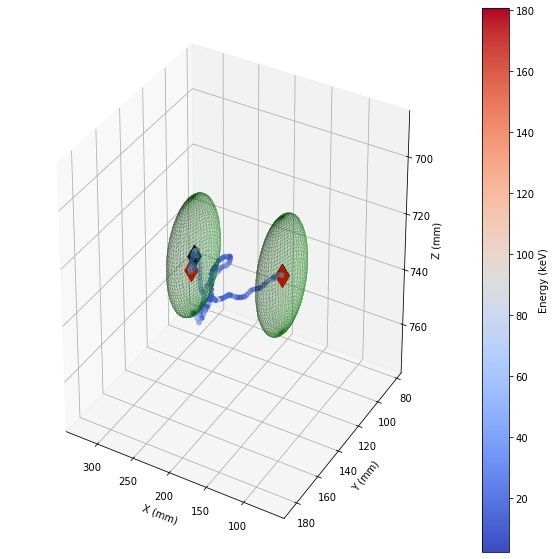

event id  = 4245, energy = 2418.90 keV

        Reconstructed extrema:
        e1 = (-283.543212890625, -129.6402130126953, 1058.2559814453125) in mm
        e2 = (-258.72954815182254, -117.43569303151466, 1028.7757956336384) in mm
        True extrema:
        t1 = [-268.60858154 -120.45092773 1067.78295898] in mm
        t2 = [-258.67672729 -117.63876343 1029.04833984] in mm
        Distance true-reco:
        d1 =  20.0     in mm
        d2 =   0.3     in mm
        Energy blobs:
        eb1 = [23.827726021409035, 59.734861832112074, 111.69429775327444, 168.47682651132345, 205.54096484556794, 275.5919222254306, 340.308252023533, 603.3896463923156, 647.2113630734384, 685.2189679630101] keV
        eb2 = [190.82201831042767, 311.7536325007677, 338.68954703211784, 372.63884115964174, 451.3942305929959, 458.3086557686329, 535.7419336214662, 584.5806514844298, 604.5500123873353, 623.4399559907615] keV
        


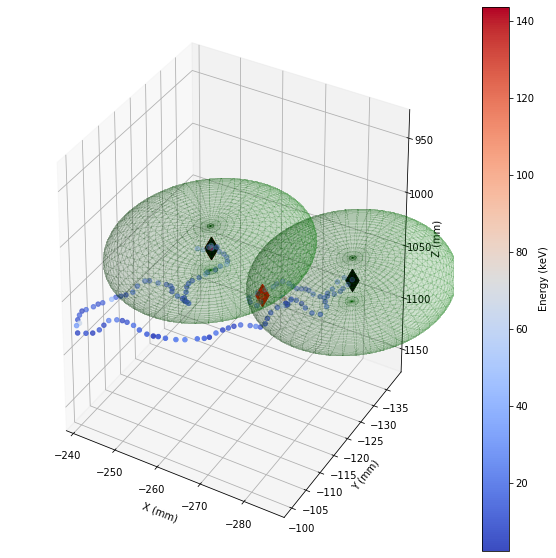

event id  = 4246, energy = 1643.02 keV

        Reconstructed extrema:
        e1 = (181.74057006835938, -47.822505950927734, 1147.7315673828125) in mm
        e2 = (208.6959698077951, -52.99777377894228, 1143.8181596347322) in mm
        True extrema:
        t1 = [ 181.75436401  -48.72834015 1147.29760742] in mm
        t2 = [ 207.92175293  -51.18326569 1145.31726074] in mm
        Distance true-reco:
        d1 =   1.0     in mm
        d2 =   2.5     in mm
        Energy blobs:
        eb1 = [270.7314258441329, 300.49660336226225, 313.6886674910784, 355.4323697462678, 408.4758502431214, 415.9443252719939, 431.25186720862985, 462.11338648572564, 494.7576285339892, 678.1695298850536] keV
        eb2 = [209.2364989221096, 319.1006314009428, 389.64193500578403, 410.743466578424, 433.05132258683443, 455.37615241482854, 525.2626677975059, 540.2242988348007, 555.3946392610669, 576.8944760784507] keV
        


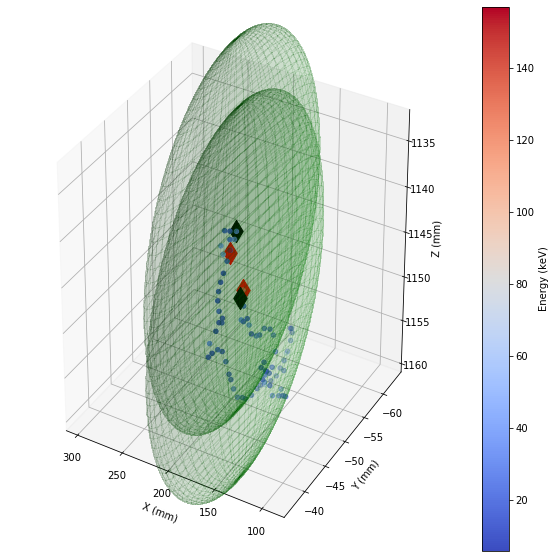

event id  = 4476, energy = 2447.79 keV

        Reconstructed extrema:
        e1 = (307.9973922818295, 218.36206267262065, 666.8290354327912) in mm
        e2 = (358.48663330078125, 208.8977508544922, 659.2962036132812) in mm
        True extrema:
        t1 = [307.57269287 218.54180908 667.0737915 ] in mm
        t2 = [349.70523071 191.04335022 640.23931885] in mm
        Distance true-reco:
        d1 =   0.5     in mm
        d2 =  27.6     in mm
        Energy blobs:
        eb1 = [148.85258302092552, 210.02238802611828, 259.0258698910475, 318.6398632824421, 354.86411210149527, 369.26896777004004, 375.5375691689551, 384.1272206045687, 405.7952524162829, 411.93690802901983] keV
        eb2 = [29.71406583674252, 71.76791992969811, 118.62882762216032, 265.1871463749558, 286.9824308436364, 350.59987124986947, 385.0098189432174, 440.8563117031008, 485.6296118814498, 548.5333588439971] keV
        


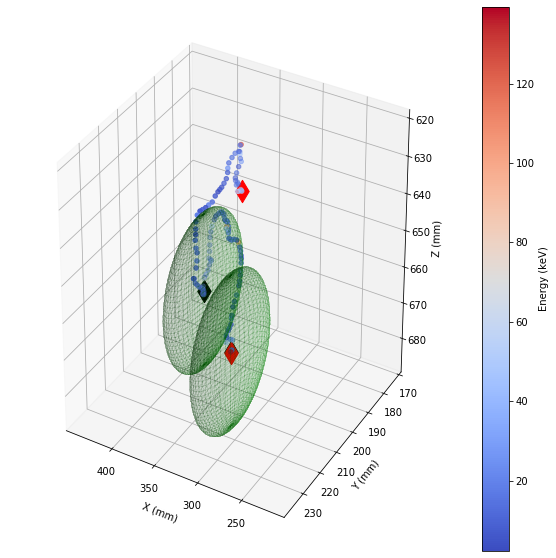

event id  = 4477, energy = 2436.82 keV

        Reconstructed extrema:
        e1 = (-461.025439842139, 6.783266348155387, 204.31479792987255) in mm
        e2 = (-414.2199032186288, 14.687584092407498, 228.41286331505233) in mm
        True extrema:
        t1 = [-454.60287476    4.74366474  204.60333252] in mm
        t2 = [-413.49194336   16.77793503  229.81996155] in mm
        Distance true-reco:
        d1 =   6.7     in mm
        d2 =   2.6     in mm
        Energy blobs:
        eb1 = [65.59403985738754, 91.24926570802927, 242.6492185331881, 433.03867476060987, 450.9055744856596, 528.070508968085, 964.996799826622, 1054.555301554501, 1181.1729669570923, 1195.1682604849339] keV
        eb2 = [40.04921251907945, 370.6600167788565, 503.86901339516044, 586.9907750748098, 622.2652425058186, 638.7567673809826, 699.8839066363871, 712.3496709391475, 726.3938961550593, 777.6070358231664] keV
        


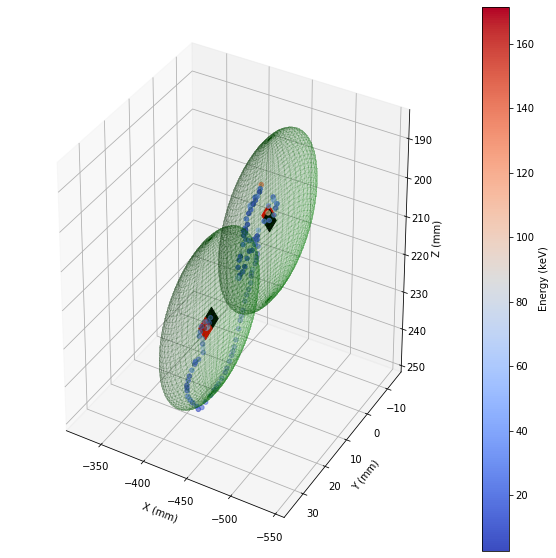

In [287]:
bbdf = single_track_interactive_analysis(rbbst,
                                         rbb.tExtrema,
                                         rb          = rb,
                                         events_int  = 10,
                                         figsize     = (10,10),
                                         fontsize    = 10,
                                         rangeshift  = 100)

In [289]:
bbdf

event_id       energy    rb         eb1         eb2  \
evt_number rb_number                                                        
0          0               213  2439.155322   2.5   46.660701  140.442936   
           1               213  2439.155322   4.5   71.793175  248.278705   
           2               213  2439.155322   6.5   90.970896  267.183330   
           3               213  2439.155322   8.5  151.648922  321.983889   
           4               213  2439.155322  10.5  170.235332  332.977947   
...                        ...          ...   ...         ...         ...   
1760       5               931  2440.039477  12.5  187.662540  555.505011   
           6               931  2440.039477  14.5  206.391641  604.030253   
           7               931  2440.039477  16.5  242.692674  649.151777   
           8               931  2440.039477  18.5  321.876571  700.872645   
           9               931  2440.039477  20.5  353.297297  719.148185   

                            d1         d2  
evt_number rb_number                       
0          0          0.309752  17.980763  
           1          0.309752  17.980763  
           2          0.309752  17.980763  
           3          0.309752  17.980763  
           4          0.309752  17.980763  
...                        ...        ...  
1760       5          1.414261  15.755880  
           6          1.414261  15.755880  
           7          1.414261  15.755880  
           8          1.414261  15.755880  
           9          1.414261  15.755880  

[17610 rows x 7 columns]

event id  = 10461, energy = 120.41 keV

        Reconstructed extrema:
        e1 = (-461.4136652998185, 139.97639295043376, 274.09749894477727) in mm
        e2 = (-471.08768645683153, 140.36426773490987, 282.4717695476774) in mm
        True extrema:
        t1 = [-461.02450562  141.25360107  273.68969727] in mm
        t2 = [-471.43814087  140.74824524  282.66333008] in mm
        Distance true-reco:
        d1 =   1.4     in mm
        d2 =   0.6     in mm
        Energy blobs:
        eb1 = [23.616740480065346, 36.66494553908706, 57.9195786267519, 73.68423603475094, 88.2763871923089, 107.17110754922032, 120.41000137105584, 120.41000137105584, 120.41000137105584, 120.41000137105584] keV
        eb2 = [25.67075565457344, 46.7257653363049, 62.49042274430394, 69.89874970167875, 90.51465895026922, 102.4597086943686, 120.41000137105584, 120.41000137105584, 120.41000137105584, 120.41000137105584] keV
        


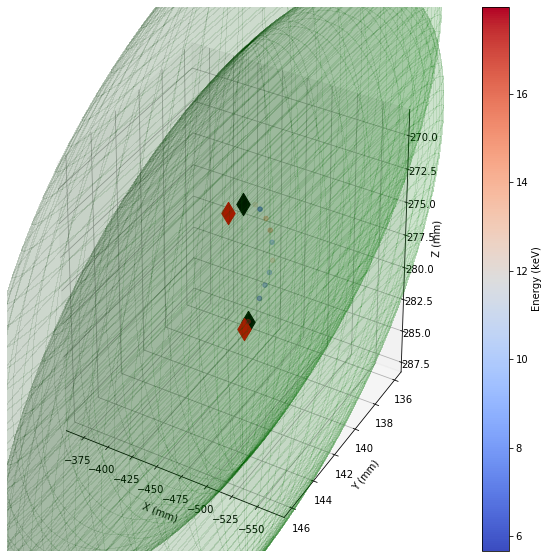

event id  = 10462, energy = 998.64 keV

        Reconstructed extrema:
        e1 = (429.9571652879632, -235.80298266389113, 1145.4845558575773) in mm
        e2 = (397.16535278611764, -191.51666577164193, 1204.226391397232) in mm
        True extrema:
        t1 = [ 429.72814941 -236.60076904 1144.3861084 ] in mm
        t2 = [ 397.34472656 -192.01776123 1205.0625    ] in mm
        Distance true-reco:
        d1 =   1.4     in mm
        d2 =   1.0     in mm
        Energy blobs:
        eb1 = [21.128805354237556, 44.813524931669235, 61.21793948113918, 74.49410576373339, 87.62567210942507, 106.45882319658995, 116.70445185154676, 136.39163691550493, 163.66587113589048, 179.88476995378733] keV
        eb2 = [38.350995630025864, 47.75859788060188, 62.6993253827095, 91.01169742643833, 98.84419105947018, 107.35442023724318, 126.8779025413096, 143.92470801249146, 150.34985868260264, 169.75133446976542] keV
        


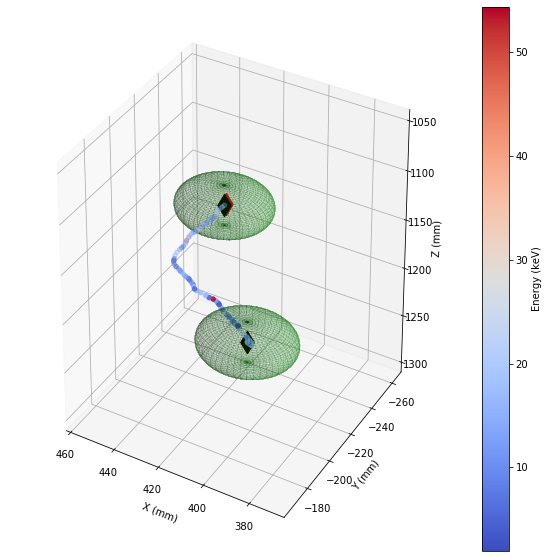

event id  = 10463, energy = 2096.31 keV

        Reconstructed extrema:
        e1 = (-47.50941848754883, -483.95037841796875, 857.5911254882812) in mm
        e2 = (-59.43205929656926, -394.95296200751716, 888.6886521088194) in mm
        True extrema:
        t1 = [ -46.66257477 -484.47543335  857.55938721] in mm
        t2 = [ -59.16018295 -396.35769653  888.70263672] in mm
        Distance true-reco:
        d1 =   1.0     in mm
        d2 =   1.4     in mm
        Energy blobs:
        eb1 = [182.33713880181313, 364.435650408268, 477.1333383396268, 491.6921006515622, 510.605332441628, 543.3139065280557, 551.8245147541165, 591.8673994019628, 611.2869819626212, 619.5293590426445] keV
        eb2 = [32.148608937859535, 70.88303938508034, 77.5479981675744, 101.19739454239607, 117.7261876873672, 245.58887956663966, 270.10495541617274, 277.68021170049906, 359.47397304698825, 370.411257725209] keV
        


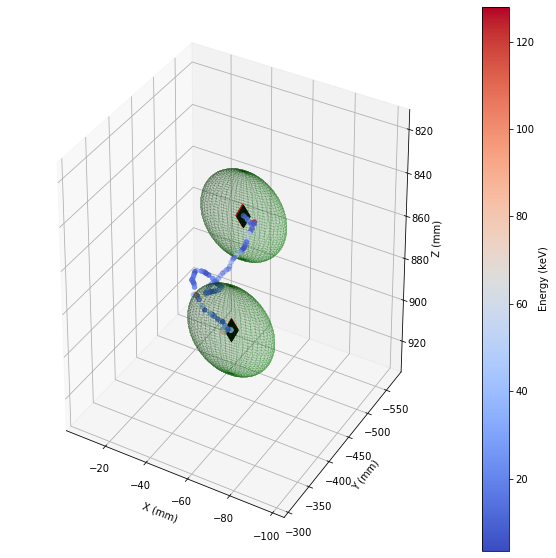

event id  = 10464, energy = 2123.15 keV

        Reconstructed extrema:
        e1 = (100.93311309814453, 83.74534606933594, 156.0075225830078) in mm
        e2 = (111.55767566658812, 96.14337608347459, 180.41133089103792) in mm
        True extrema:
        t1 = [100.23540497  83.08205414 155.7381897 ] in mm
        t2 = [111.05493927  96.81087494 180.23371887] in mm
        Distance true-reco:
        d1 =   1.0     in mm
        d2 =   0.9     in mm
        Energy blobs:
        eb1 = [27.87386905401945, 37.90712542831898, 50.924016162753105, 70.93894993886352, 70.93894993886352, 88.7393350712955, 100.46530375257134, 109.77697419002652, 127.08142632618546, 132.98474438488483] keV
        eb2 = [102.22111269831657, 117.42642195895314, 138.84871499612927, 261.4004868082702, 299.762848764658, 306.07757065445185, 326.49391423910856, 360.7685463503003, 378.4515717998147, 396.8534804880619] keV
        


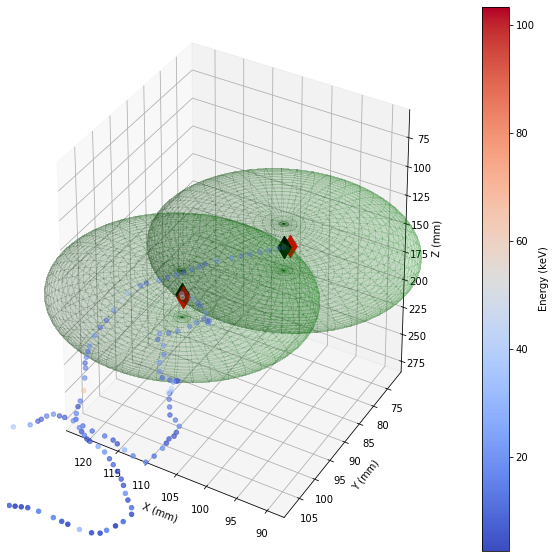

event id  = 1804, energy = 2426.04 keV

        Reconstructed extrema:
        e1 = (-297.25211693530684, 187.29360696457994, 201.86419987531008) in mm
        e2 = (-267.675326123965, 193.53080659529095, 164.11370901181263) in mm
        True extrema:
        t1 = [-297.05679321  187.52183533  201.39840698] in mm
        t2 = [-262.35733032  169.33782959  177.91455078] in mm
        Distance true-reco:
        d1 =   0.6     in mm
        d2 =  28.4     in mm
        Energy blobs:
        eb1 = [24.55930272117257, 85.20381385460496, 101.29295149818063, 107.89372865110636, 141.09378401190042, 166.0200571641326, 179.51277596876025, 204.77137295529246, 216.70827316120267, 220.52120021544397] keV
        eb2 = [198.16938787698746, 322.9081225581467, 364.0852733515203, 384.97466361150146, 460.598380304873, 499.42467152141035, 533.2216692622751, 566.6613194625825, 618.3272700291127, 716.3338044192642] keV
        


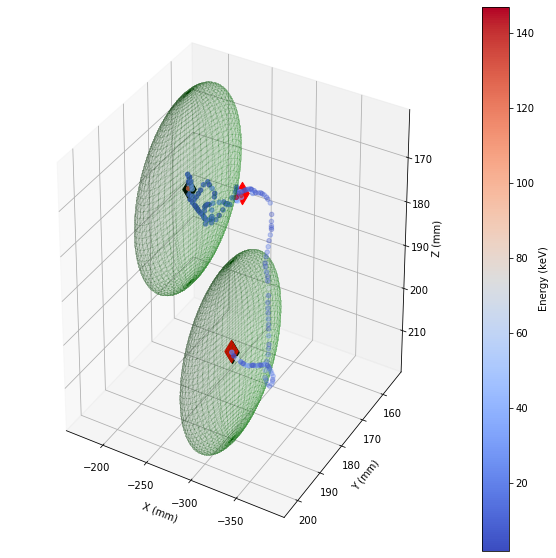

event id  = 1805, energy = 2443.19 keV

        Reconstructed extrema:
        e1 = (-80.78822270378245, 37.987960636809696, 487.7884633290278) in mm
        e2 = (-118.69511415825384, 69.58796019481387, 430.834403942252) in mm
        True extrema:
        t1 = [-80.57872009  37.60435104 487.94540405] in mm
        t2 = [-75.50740051  40.45306778 447.70611572] in mm
        Distance true-reco:
        d1 =   0.5     in mm
        d2 =  54.8     in mm
        Energy blobs:
        eb1 = [29.667051509022713, 65.19356556236744, 109.60742365568876, 132.67114525660872, 184.45154232904315, 240.59831211343408, 254.1250460781157, 294.1408297047019, 316.69543869793415, 359.07158674672246] keV
        eb2 = [70.42514719069004, 85.53931792266667, 90.6561438459903, 105.24610080756247, 115.90204038657248, 126.60885066725314, 145.47155261971056, 156.80780331604183, 171.20205867104232, 180.9219343122095] keV
        


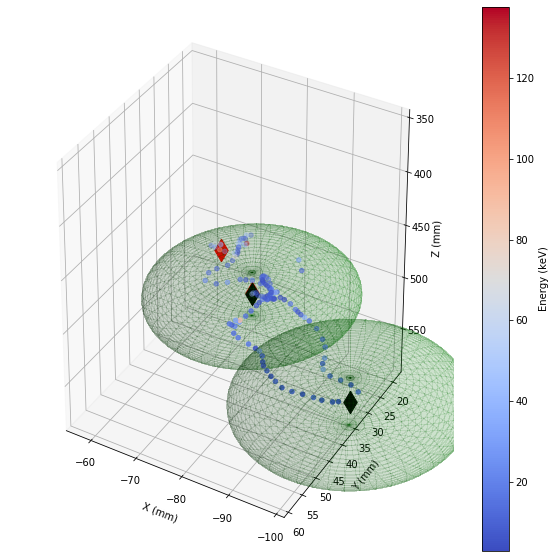

event id  = 5136, energy = 2437.34 keV

        Reconstructed extrema:
        e1 = (-228.4695232048228, 154.51211628952097, 1060.164040457523) in mm
        e2 = (-326.05212185654096, 163.72867437074368, 997.2463436275318) in mm
        True extrema:
        t1 = [-228.01422119  154.4197998  1060.89599609] in mm
        t2 = [-316.53692627  161.86175537  993.4185791 ] in mm
        Distance true-reco:
        d1 =   0.9     in mm
        d2 =  10.4     in mm
        Energy blobs:
        eb1 = [104.01397757232189, 140.17044892534614, 182.65876593068242, 233.2521346397698, 301.67923821136355, 691.3971807807684, 804.9500538036227, 945.9916213527322, 1016.2149835377932, 1098.9442602731287] keV
        eb2 = [19.811982288956642, 28.51733472198248, 42.02429577708244, 66.86960346996784, 79.19450290501118, 105.23073142394423, 105.23073142394423, 141.99161296710372, 154.86597828567028, 173.73495735228062] keV
        


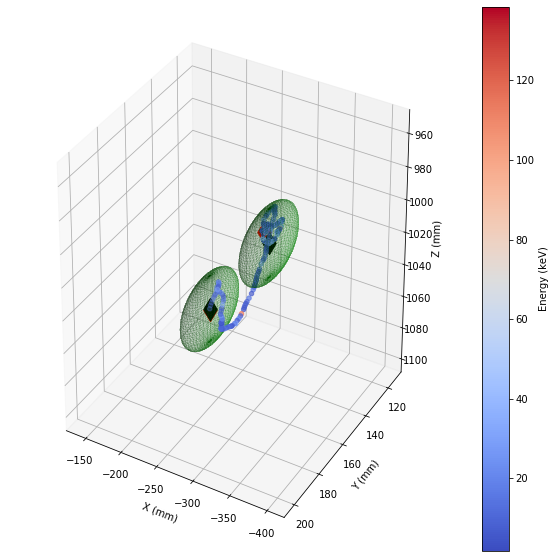

event id  = 5139, energy = 2422.55 keV

        Reconstructed extrema:
        e1 = (382.14495849609375, 229.0493621826172, 362.3044738769531) in mm
        e2 = (358.7235520609601, 248.61599884731567, 307.3675499239307) in mm
        True extrema:
        t1 = [383.01248169 228.74699402 361.91220093] in mm
        t2 = [358.72723389 248.30792236 307.19277954] in mm
        Distance true-reco:
        d1 =   1.0     in mm
        d2 =   0.4     in mm
        Energy blobs:
        eb1 = [145.45389008708298, 190.7612329814583, 342.15044998563826, 422.896831529215, 478.9086726959795, 505.4752298165113, 570.9326539654285, 588.531916262582, 621.9081718008965, 636.7571789305657] keV
        eb2 = [21.64872270077467, 51.84775311499834, 67.16761831194162, 73.6542409285903, 94.12289038300514, 113.2983323186636, 125.3938227891922, 136.33207604289055, 148.47897365689278, 171.42255045473576] keV
        


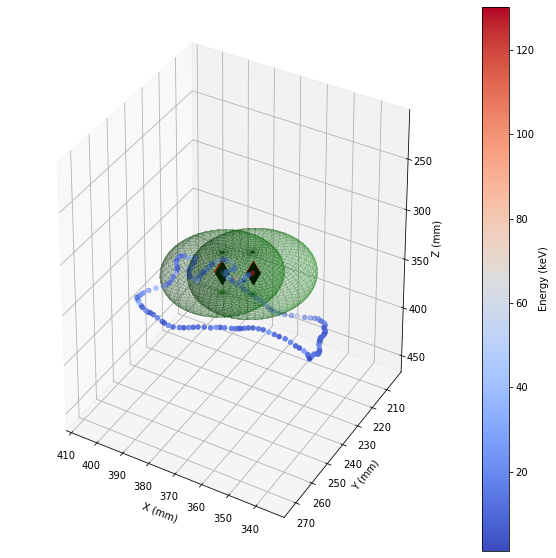

event id  = 5186, energy = 1686.81 keV

        Reconstructed extrema:
        e1 = (-123.03219604492188, 398.2037353515625, 87.5623550415039) in mm
        e2 = (-157.49173780886855, 465.3290037885565, 124.6872530767347) in mm
        True extrema:
        t1 = [-122.04006195  398.08859253   87.51927185] in mm
        t2 = [-157.02098083  466.27075195  124.55940247] in mm
        Distance true-reco:
        d1 =   1.0     in mm
        d2 =   1.1     in mm
        Energy blobs:
        eb1 = [43.98981109261513, 49.67837641015649, 67.65321223065257, 73.29261861741543, 98.51994784548879, 111.74696078523993, 127.07690009847283, 152.73714205250144, 179.15970599278808, 193.21519415825605] keV
        eb2 = [22.59162161499262, 72.44096789509058, 86.02801710367203, 98.75904489308596, 110.29947362840176, 122.57671169936657, 149.29449744522572, 167.29472763836384, 173.10134274885058, 194.71362372860312] keV
        


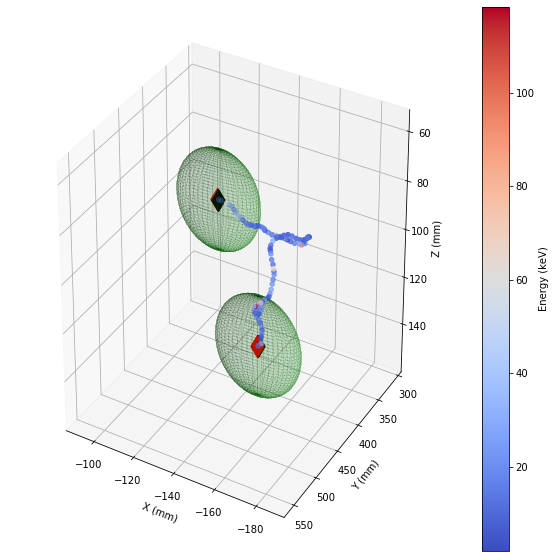

event id  = 5187, energy = 1846.76 keV

        Reconstructed extrema:
        e1 = (-353.52461979197966, -233.22683863917985, 1116.4954956836605) in mm
        e2 = (-374.550808397099, -318.5501178860346, 1095.0344277018946) in mm
        True extrema:
        t1 = [-353.47973633 -232.42504883 1116.5625    ] in mm
        t2 = [-374.52224731 -319.05654907 1095.8203125 ] in mm
        Distance true-reco:
        d1 =   0.8     in mm
        d2 =   0.9     in mm
        Energy blobs:
        eb1 = [68.2121179997921, 100.54090991616249, 128.4407968632877, 178.00373723730445, 195.6375571899116, 288.5713854338974, 294.59828964900225, 405.25914763566107, 417.902220855467, 435.3967177448794] keV
        eb2 = [59.11563336849213, 79.27828561514616, 91.56936313956976, 104.1958755813539, 116.59148475155234, 132.09547335281968, 187.6904838718474, 215.6545245088637, 215.6545245088637, 244.8048093356192] keV
        


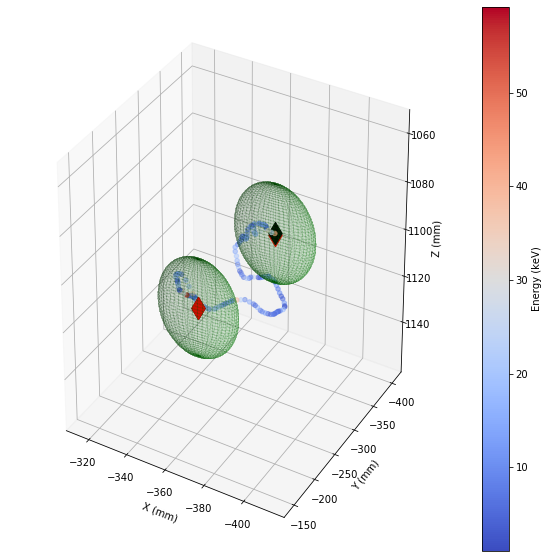

In [290]:
e1df = single_track_interactive_analysis(r1est,
                                         r1e.tExtrema,
                                         rb          = rb,
                                         events_int  = 10,
                                         figsize     = (10,10),
                                         fontsize    = 10,
                                         rangeshift  = 100)

In [301]:
e1df[0:20]

event_id      energy    rb         eb1         eb2  \
evt_number rb_number                                                       
0          0             10461  120.410001   2.5   23.616740   25.670756   
           1             10461  120.410001   4.5   36.664946   46.725765   
           2             10461  120.410001   6.5   57.919579   62.490423   
           3             10461  120.410001   8.5   73.684236   69.898750   
           4             10461  120.410001  10.5   88.276387   90.514659   
           5             10461  120.410001  12.5  107.171108  102.459709   
           6             10461  120.410001  14.5  120.410001  120.410001   
           7             10461  120.410001  16.5  120.410001  120.410001   
           8             10461  120.410001  18.5  120.410001  120.410001   
           9             10461  120.410001  20.5  120.410001  120.410001   
1          0             10462  998.640893   2.5   21.128805   38.350996   
           1             10462  998.640893   4.5   44.813525   47.758598   
           2             10462  998.640893   6.5   61.217939   62.699325   
           3             10462  998.640893   8.5   74.494106   91.011697   
           4             10462  998.640893  10.5   87.625672   98.844191   
           5             10462  998.640893  12.5  106.458823  107.354420   
           6             10462  998.640893  14.5  116.704452  126.877903   
           7             10462  998.640893  16.5  136.391637  143.924708   
           8             10462  998.640893  18.5  163.665871  150.349859   
           9             10462  998.640893  20.5  179.884770  169.751334   

                            d1        d2  
evt_number rb_number                      
0          0          1.396069  0.554033  
           1          1.396069  0.554033  
           2          1.396069  0.554033  
           3          1.396069  0.554033  
           4          1.396069  0.554033  
           5          1.396069  0.554033  
           6          1.396069  0.554033  
           7          1.396069  0.554033  
           8          1.396069  0.554033  
           9          1.396069  0.554033  
1          0          1.376771  0.991135  
           1          1.376771  0.991135  
           2          1.376771  0.991135  
           3          1.376771  0.991135  
           4          1.376771  0.991135  
           5          1.376771  0.991135  
           6          1.376771  0.991135  
           7          1.376771  0.991135  
           8          1.376771  0.991135  
           9          1.376771  0.991135

In [292]:
bbdfE = bbdf[in_range(bbdf.energy, 2400, 2500)]

In [293]:
len(bbdfE) / len(bbdf)

0.7257240204429302

In [294]:
e1dfE = e1df[in_range(e1df.energy, 2400, 2500)]

In [295]:
energy_eff_bb    = len(bbdfE) / len(bbdf)
energy_eff_1e    = len(e1dfE) / len(e1df)


print(f" single track eff bb          = {st_eff_bb}")
print(f" single track eff 1e          = {st_eff_1e}")
print(f" energy       eff bb          = {energy_eff_bb}")
print(f" energy       eff 1e          = {energy_eff_1e}")

 single track eff bb          = 0.6600449775112444
 single track eff 1e          = 0.6625200642054575
 energy       eff bb          = 0.7257240204429302
 energy       eff 1e          = 0.628709872804361


(array([  90.,  140.,  200.,  320.,  800., 1900., 4130., 3470., 1520.,
         210.]),
 array([2400.60939407, 2406.17620667, 2411.74301927, 2417.30983186,
        2422.87664446, 2428.44345706, 2434.01026966, 2439.57708225,
        2445.14389485, 2450.71070745, 2456.27752005]),
 <a list of 10 Patch objects>)

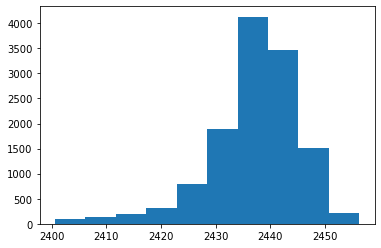

In [296]:
_  = plt.hist(bbdfE.energy)

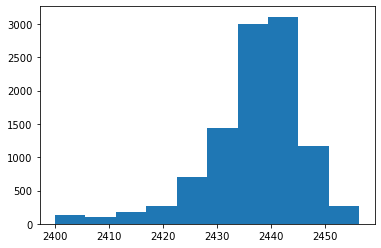

In [297]:
_  = plt.hist(e1dfE.energy)

### Selecting blobs

In [302]:
bbr20 = bbdfE[bbdfE.rb==20.5]
e1r20 = e1dfE[e1dfE.rb==20.5]

In [303]:
bbr20

,,event_id,energy,rb,eb1,eb2,d1,d2
evt_number,rb_number,,,,,,,
0,9,213,2439.155322,20.5,866.026142,417.844492,0.309752,17.980763
1,9,214,2437.588055,20.5,690.671005,221.472915,3.153362,0.289493
2,9,215,2438.890946,20.5,441.297655,1052.653112,7.780309,21.598833
3,9,172,2435.026419,20.5,543.098558,1046.758506,0.584601,10.992484
4,9,173,2440.788645,20.5,645.127114,973.948300,0.221828,2.092737
...,...,...,...,...,...,...,...,...
1754,9,10861,2442.541158,20.5,666.544576,611.563863,7.700412,9.752516
1756,9,10864,2439.865599,20.5,515.871169,482.123014,30.531537,1.944917
1757,9,4872,2427.497116,20.5,674.016390,639.792012,6.192818,11.117439


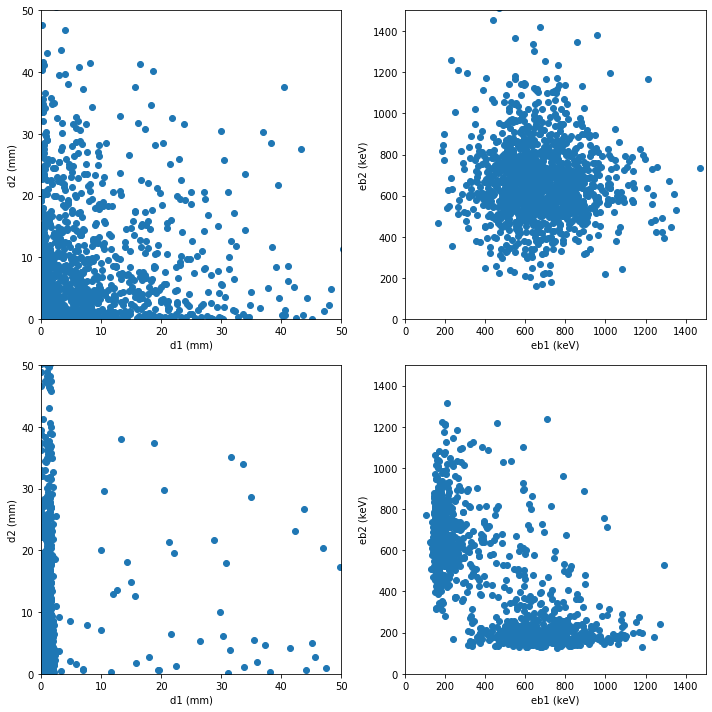

In [308]:
fig = plt.figure(figsize=(10,10))
ax  = fig.add_subplot(2, 2, 1)
plt.scatter(bbr20.d1, bbr20.d2)
ax.set_xlim([0,50])
ax.set_ylim([0,50])
ax.set_xlabel('d1 (mm)')
ax.set_ylabel('d2 (mm)')

ax  = fig.add_subplot(2, 2, 2)
plt.scatter(bbr20.eb1, bbr20.eb2)
ax.set_xlim([0,1500])
ax.set_ylim([0,1500])
ax.set_xlabel('eb1 (keV)')
ax.set_ylabel('eb2 (keV)')

ax  = fig.add_subplot(2, 2, 3)
plt.scatter(e1r20.d1, e1r20.d2)
ax.set_xlim([0,50])
ax.set_ylim([0,50])
ax.set_xlabel('d1 (mm)')
ax.set_ylabel('d2 (mm)')

ax  = fig.add_subplot(2, 2, 4)
plt.scatter(e1r20.eb1, e1r20.eb2)
ax.set_xlim([0,1500])
ax.set_ylim([0,1500])
ax.set_xlabel('eb1 (keV)')
ax.set_ylabel('eb2 (keV)')

plt.tight_layout()
plt.show()

### Graph Tracks and True Extrema

- The radius of the blob is taken as having the same size of the voxelisation. This is a parameter which can be varied for optimisation

In [32]:
rb = 3

In [33]:
total_events = rbb.trackRecoEventStats.e_total

#### bb0nu

##### track dataframe

In [34]:
gtbb = gtrack_df(rbb.gtracks, rb)

In [35]:
gtbb.head()

event_id  track_id  n_voxels  trak_length       energy  \
evt_number trk_number                                                           
0          0                212         0        88   114.865197  1542.096064   
           1                212         1         1     0.000000    12.581009   
           2                212         2        12    11.301259   461.863002   
           3                212         3         2     0.110008    29.781303   
           4                212         4         6     0.614310   132.281468   

                             x_e1        y_e1        z_e1  energy_e1  nvox_b1  \
evt_number trk_number                                                           
0          0          -161.995430 -409.915396  798.834450   0.000810        4   
           1          -154.306005 -210.879696  907.142098   0.012581        1   
           2          -112.775632 -435.865749  785.773207   0.044063        7   
           3          -110.531841 -155.649554  899.194706   0.006808        2   
           4          -107.548492 -171.458677  903.234897   0.015715        6   

                        energy_b1        x_e2        y_e2        z_e2  \
evt_number trk_number                                                   
0          0           189.057486 -106.452058 -445.385531  764.981847   
           1            12.581009 -154.306005 -210.879696  907.142098   
           2           320.760725 -105.179881 -435.634920  784.444863   
           3            29.781303 -110.535748 -155.687082  899.298041   
           4           132.281468 -107.507074 -171.589099  902.636022   

                       energy_e2  nvox_b2   energy_b2  
evt_number trk_number                                  
0          0            0.016251        2   25.551913  
           1            0.012581        1   12.581009  
           2            0.054272        2   96.259121  
           3            0.022973        2   29.781303  
           4            0.030478        6  132.281468

In [36]:
rbb_1t_rb_3, rbb_multi_rb_3 = event_list_by_multiplicity(gtbb)

In [161]:
gtbb10 = gtrack_df(rbb.gtracks, 10)

In [162]:
rbb_1t_rb_10, rbb_multi_rb_10 = event_list_by_multiplicity(gtbb10)

##### Select the topology of single tracks

In [37]:
g1tbb = select_gtrack_topology(gtbb, topology = "single")

In [38]:
eff_str_bb = len(g1tbb) / total_events
print(f"for bb0nu: single track cut efficiency = {eff_str_bb}")

for bb0nu: single track cut efficiency = 0.5269865067466267


##### Energy cut

In [39]:
fbb, eff_energy_bb = select_energy(g1tbb, energy_range=(2400, 2500))
print(f"for bb0nu: energy cut efficiency = {eff_energy_bb}")

for bb0nu: energy cut efficiency = 0.7098150782361309


##### Histograms for fiducial events (single track topology and energy cut)

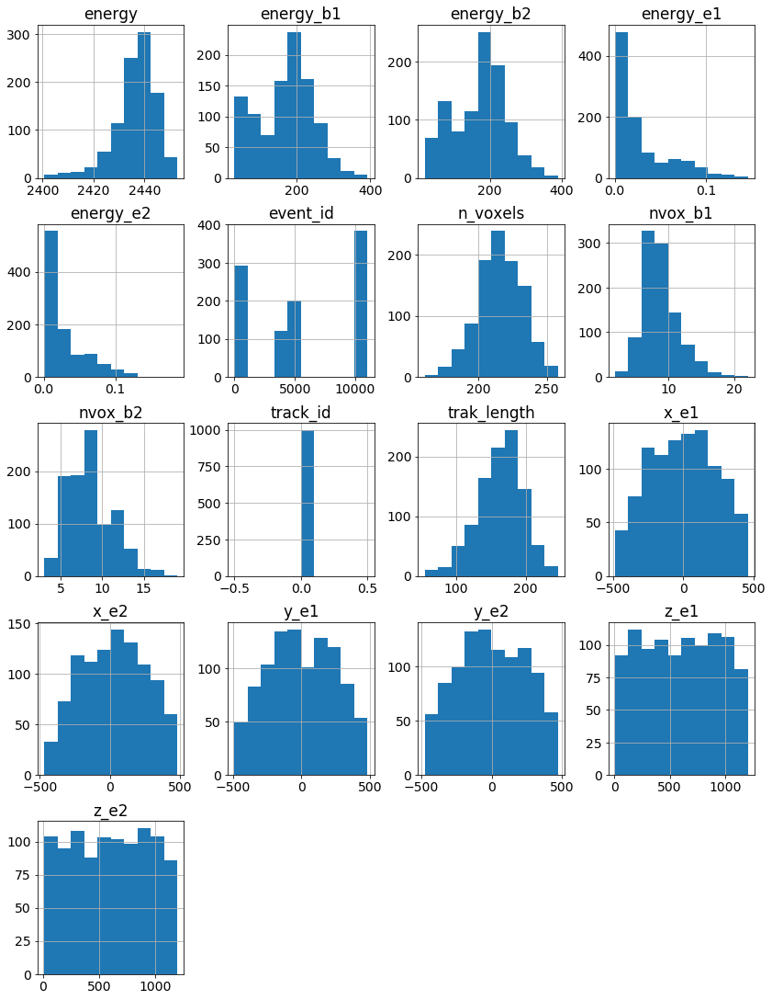

In [40]:
hist = fbb.hist(figsize = (14,19))

##### Energy blob1 vs blob2

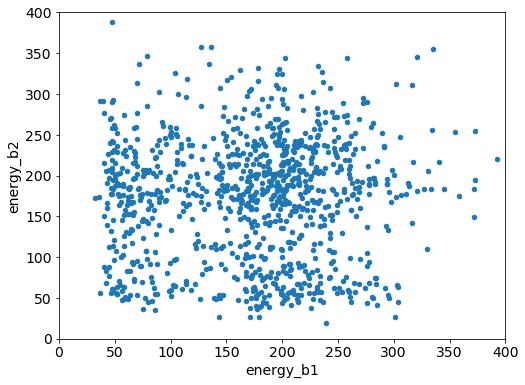

In [41]:
ax1 = fbb.plot.scatter(x='energy_b1', y='energy_b2')
ax1.set_xlim([0,400])
ax1.set_ylim([0,400])
plt.show()

#### 1e

##### Track dataframe

In [42]:
gt1e = gtrack_df(r1e.gtracks, rb)

In [43]:
r1e_1t_rb_3, r1e_multi_rb_3 = event_list_by_multiplicity(gt1e)

##### Select the topology of single tracks

In [44]:
g1t1e = select_gtrack_topology(gt1e, topology = "single")

In [45]:
eff_str_1e = len(g1t1e) / total_events
print(f"for 1e: single track cut efficiency = {eff_str_1e}")

for 1e: single track cut efficiency = 0.5059970014992504


##### Energy cut

In [46]:
f1e, eff_energy_1e = select_energy(g1t1e, energy_range=(2400, 2500))
print(f"for 1e: energy cut efficiency = {eff_energy_1e}")

for 1e: energy cut efficiency = 0.6051851851851852


##### histograms for fiducial tracks (1track, energy range)

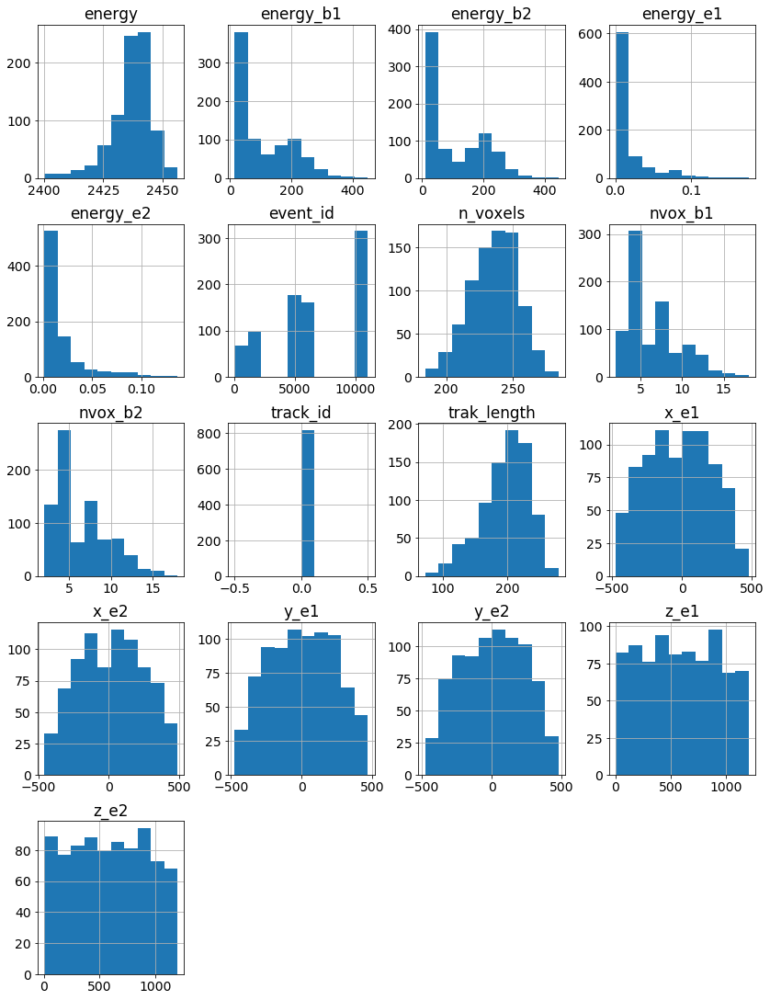

In [47]:
hist = f1e.hist(figsize = (14,19))

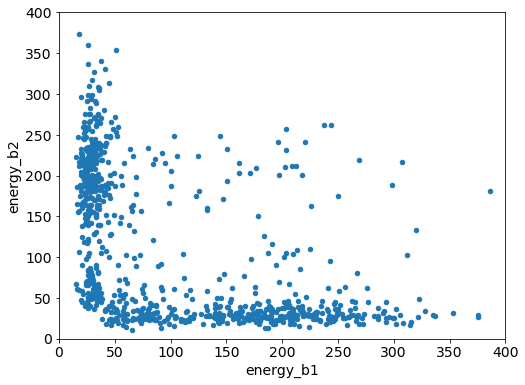

In [48]:
ax1 = f1e.plot.scatter(x='energy_b1', y='energy_b2')
ax1.set_xlim([0,400])
ax1.set_ylim([0,400])
plt.show()

### Blob analysis

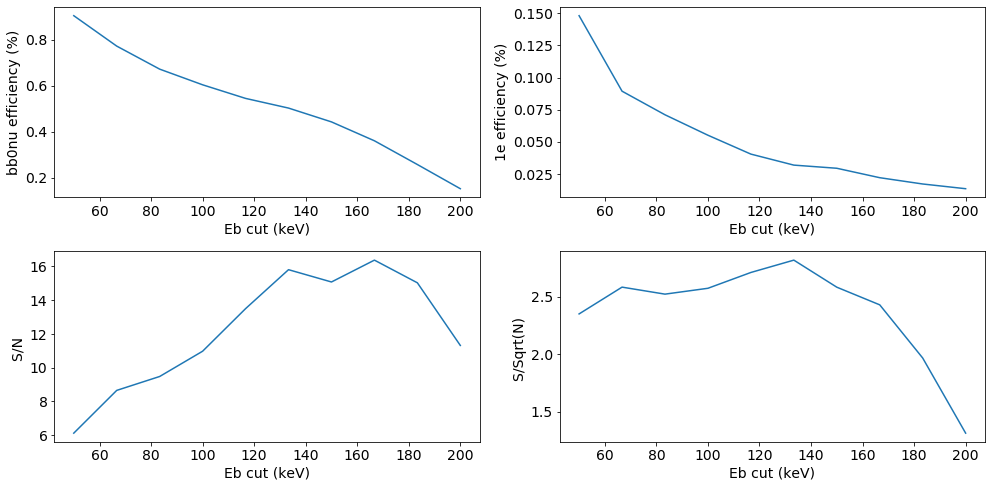

In [49]:
select_blobs_eff_energy(rbb, fbb, f1e, eb_range = (50,200), figsize=(14,7))

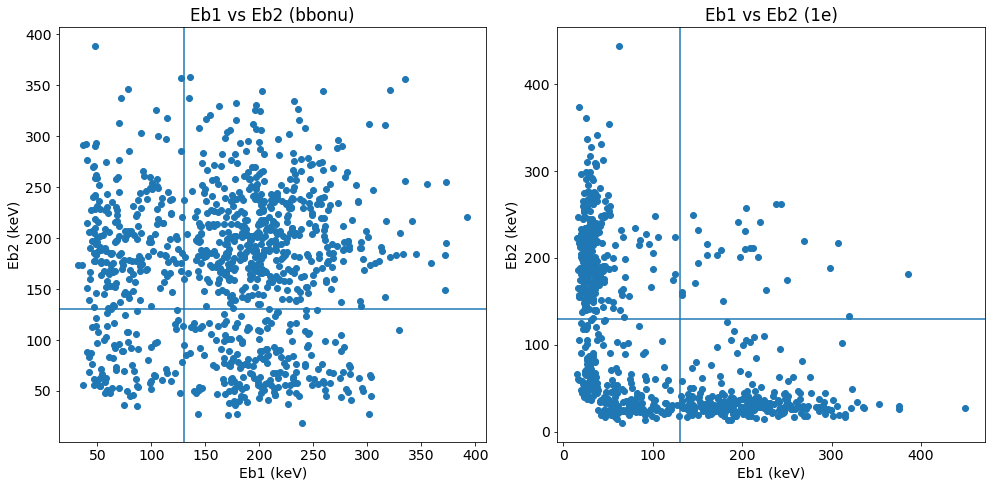

In [50]:
blob_energy(fbb, f1e, eb_cut=130, figsize=(14,7))

##### blob selection

In [72]:
fbb2b, eff_2b_bb = select_two_blobs(fbb, eb_cut= 130)

In [73]:
fbb1e, eff_2b_1e = select_two_blobs(f1e, eb_cut= 130)

#### Global efficiency

##### bb0nu

In [74]:
print(f"for bb0nu: single track cut efficiency = {eff_str_bb:5.3f}")
print(f"for bb0nu: energy cut efficiency       = {eff_energy_bb:5.3f}")
print(f"for bb0nu: 2b cut efficiency           = {eff_2b_bb:5.3f}")
print(f"for bb0nu: overall efficiency          = {(eff_2b_bb * eff_energy_bb * eff_str_bb):5.3f}")

for bb0nu: single track cut efficiency = 0.527
for bb0nu: energy cut efficiency       = 0.710
for bb0nu: 2b cut efficiency           = 0.511
for bb0nu: overall efficiency          = 0.191


##### 1e

In [75]:
print(f"for 1e: single track cut efficiency = {eff_str_1e:5.3f}")
print(f"for 1e: energy cut efficiency       = {eff_energy_1e:5.3f}")
print(f"for 1e: 2b cut efficiency           = {eff_2b_1e:5.3f}")
print(f"for 1e: overall efficiency          = {eff_2b_1e * eff_energy_1e * eff_str_1e:5.3f}")

for 1e: single track cut efficiency = 0.506
for 1e: energy cut efficiency       = 0.605
for 1e: 2b cut efficiency           = 0.035
for 1e: overall efficiency          = 0.011


In [76]:
print(f"suppression factor 2-blob = {eff_2b_bb/eff_2b_1e:5.2f}")

suppression factor 2-blob = 14.40


### True extrema analysis

#### Get (sorted) true Extrema dataframes

In [77]:
rbbtE = rbb.tExtrema.sort_values(by=['evt_number'])

In [78]:
r1etE = r1e.tExtrema.sort_values(by=['evt_number'])

In [79]:
rbbtE.head()

,evt_number,extreme_number,x,y,z,time,energy
2325,0,1,-261.039703,-230.863617,792.874023,0.523512,2.868718
2324,0,0,-273.207062,-255.572342,724.871460,0.348872,1.072744
2327,1,1,193.813828,-268.276672,269.610596,0.297654,1.984057
2326,1,0,142.678940,-234.377289,313.767792,0.545446,1.649472
2329,2,1,119.082611,-456.185028,827.313965,0.610715,3.235260


In [80]:
r1etE.head()

,evt_number,extreme_number,x,y,z,time,energy
3248,40,0,-128.768143,427.334961,476.508148,0.003298,44.649459
3249,40,1,-166.702469,421.212341,529.789001,0.528587,3.888908
3250,41,0,332.175476,-148.522003,737.123474,0.003366,11.620134
3251,41,1,297.396545,-234.403412,735.747742,0.756642,1.734917
3252,42,0,76.672745,-481.613525,275.678589,0.003386,4.068275


#### Get (sorted) dataframes for fiducially selected bb and 1e events

In [81]:
sfbb = fbb.sort_values(by=['event_id']).reset_index(level='trk_number', drop=True).\
drop(columns=['track_id'])

In [82]:
sfbb.head()

,event_id,n_voxels,trak_length,energy,x_e1,y_e1,z_e1,energy_e1,nvox_b1,energy_b1,x_e2,y_e2,z_e2,energy_e2,nvox_b2,energy_b2
evt_number,,,,,,,,,,,,,,,,
1162,0,206,177.996574,2434.332132,-272.821228,-255.967957,727.889832,0.002208,14,236.229454,-261.442345,-229.078096,792.746200,0.034101,9,202.901022
1163,1,211,185.033640,2435.044637,142.518224,-234.627799,313.905538,0.038822,8,195.458342,193.973317,-268.320487,269.445282,0.113898,6,181.206228
1164,2,223,178.125887,2439.964943,117.246289,-457.064008,826.325202,0.055159,15,281.634548,183.866106,-426.373630,830.163556,0.032127,8,197.460579
1165,3,210,140.068409,2441.591213,355.712921,82.666382,986.488770,0.010031,8,114.041334,368.951655,87.546777,990.122020,0.018695,6,67.057518
698,5,194,164.410894,2446.390537,-269.783856,-194.023810,880.893992,0.037350,7,167.349016,-228.881246,-216.195725,925.284825,0.019351,9,213.332272


In [83]:
sf1e = f1e.sort_values(by=['event_id']).reset_index(level='trk_number', drop=True).\
drop(columns=['track_id'])

In [84]:
sf1e.head()

,event_id,n_voxels,trak_length,energy,x_e1,y_e1,z_e1,energy_e1,nvox_b1,energy_b1,x_e2,y_e2,z_e2,energy_e2,nvox_b2,energy_b2
evt_number,,,,,,,,,,,,,,,,
1612,44,282,262.689312,2427.471583,-167.854187,143.703522,365.851349,0.007046,4,27.812556,-132.152675,234.293428,438.584940,0.073393,9,235.434863
1985,70,208,166.802214,2443.038449,113.481113,390.903041,903.920438,0.060368,9,207.376685,171.565109,309.391693,901.408752,0.005235,4,22.690810
1986,71,250,254.562474,2440.492894,20.315081,-334.828583,342.659393,0.004079,4,23.024959,30.010443,-314.660722,414.566844,0.014859,10,254.424943
1988,73,239,217.786559,2439.084747,223.859421,31.183203,980.425903,0.007927,4,29.749405,237.681961,61.765457,940.846191,0.002169,8,74.462012
1734,84,249,126.658000,2427.693710,212.956406,-9.707211,451.061279,0.004719,6,46.263692,219.459041,-29.922760,407.919185,0.021143,8,190.897640


#### Compute a dataframe of distances 
- d1 (d2) are defined as the closest distance between an extreme and a reconstructed extreme

##### for bb0nu

In [85]:
dfbbTE= distance_reco_true(sfbb, rbbtE, event_range=(0,-1))

In [86]:
dfbbTE.head()

,event_id,d1,d2
0,0,3.068541,1.834815
1,1,0.327962,0.233849
2,2,2.263257,0.779622
3,3,3.700832,14.622747
4,5,0.040814,1.249322


##### For 1e

In [87]:
df1eTE= distance_reco_true(sf1e, r1etE, event_range=(0,-1))

In [88]:
df1eTE.head()

,event_id,d1,d2
0,44,9.999694e-01,0.665795
1,70,1.386668e+00,0.996850
2,71,9.993747e-01,1.255272
3,73,1.136868e-13,4.538779
4,84,4.792751e+01,53.629140


##### Plot results

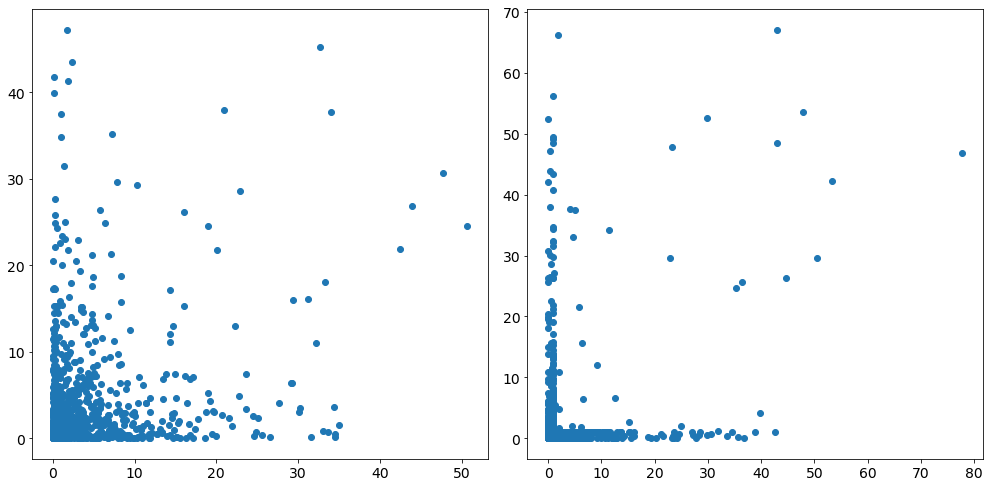

In [89]:
fig = plt.figure(figsize=(14,7))
ax  = fig.add_subplot(1, 2, 1)
plt.scatter(dfbbTE.d1, dfbbTE.d2)
ax1.set_xlim([0,50])
ax1.set_ylim([0,50])
ax  = fig.add_subplot(1, 2, 2)

plt.scatter(df1eTE.d1, df1eTE.d2)
ax1.set_xlim([0,50])
ax1.set_ylim([0,50])
plt.tight_layout()
plt.show()

##### Distance between reconstructed and true blob is o the order of the voxelisation, but spread can be large, leading to missidentification.

#### Fraction of events as a function of the distance between reconstructed and true extrema

In [90]:
d, xbb = d12_eff(dfbbTE, d_range = (0,50), figsize=(10,6))

In [91]:
d, x1e = d12_eff(df1eTE, d_range = (0,50), figsize=(10,6))

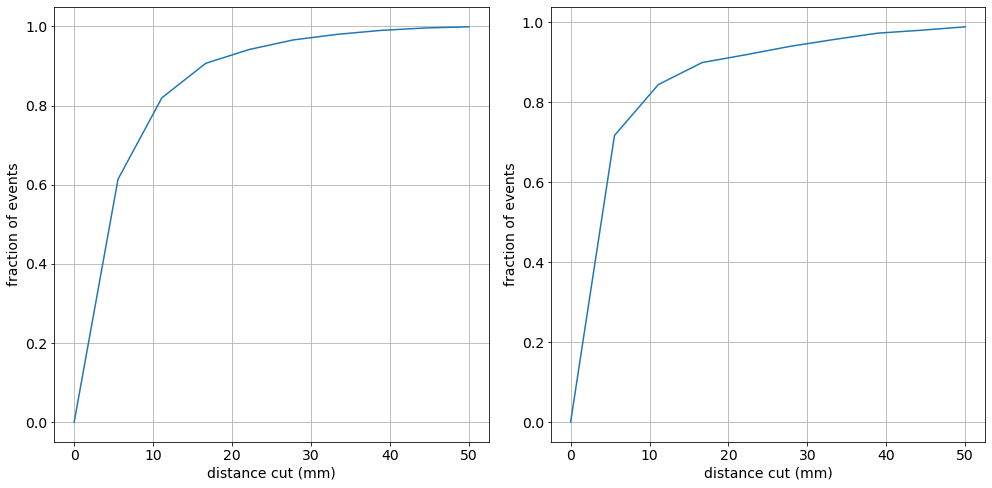

In [92]:
fig = plt.figure(figsize=(14,7))
ax  = fig.add_subplot(1, 2, 1)
plt.plot(d, xbb)
plt.xlabel("distance cut (mm)")
plt.ylabel("fraction of events")
plt.grid()
ax  = fig.add_subplot(1, 2, 2)
plt.plot(d, x1e)
plt.xlabel("distance cut (mm)")
plt.ylabel("fraction of events")
plt.grid()
plt.tight_layout()
plt.show()

### Selection efficiency when limiting distance (true-reco)

- According to the results that we have found, the selection efficiency for bb0nu should increase and the relative background for 1e should decrease as we make tighter cuts in the distance allowed between reconstructed and true extrema.

- Notice that this is not a "realistic cut" but instead a way to illustrate the limits of the algorithm.

#### |d_r - d_true | < 10 mm

##### For bb

In [93]:
events_ddf_bb = select_distance_cut(dfbbTE, sfbb, dcut=10)

In [94]:
sfbbx = sfbb[np.in1d(sfbb.event_id.values, events_ddf_bb)]

In [95]:
_, eff_2b_bb_d12 = select_two_blobs(sfbbx, eb_cut= 130)

In [96]:
print(f"for bb: 2b cut efficiency (reco)           = {eff_2b_bb:5.3f}")
print(f"for bb: 2b cut efficiency (d12 constrain)  = {eff_2b_bb_d12:5.3f}")

for bb: 2b cut efficiency (reco)           = 0.511
for bb: 2b cut efficiency (d12 constrain)  = 0.620


##### For 1e

In [97]:
events_ddf_1e = select_distance_cut(df1eTE, sf1e, dcut=5)

In [98]:
sf1ex = sf1e[np.in1d(sf1e.event_id.values, events_ddf_1e)]

In [99]:
_, eff_2b_1e_d12 = select_two_blobs(sf1ex, eb_cut= 130)

In [100]:
print(f"for 1e: 2b cut efficiency (reco)           = {eff_2b_1e:5.3f}")
print(f"for 1e: 2b cut efficiency (d12 constrain)  = {eff_2b_1e_d12:5.3f}")

for 1e: 2b cut efficiency (reco)           = 0.035
for 1e: 2b cut efficiency (d12 constrain)  = 0.012


##### Reconstruction result imposing | d_r - d_true | < 5 mm
- Notice that events with low energy dissappear, increasing the efficiency o the signal, and the fraction of background events also improves a little. However, such fraction appears to be related with adding too much energy in the blob (even when the reconstructed end voxel is within 10 mm of the true voxel

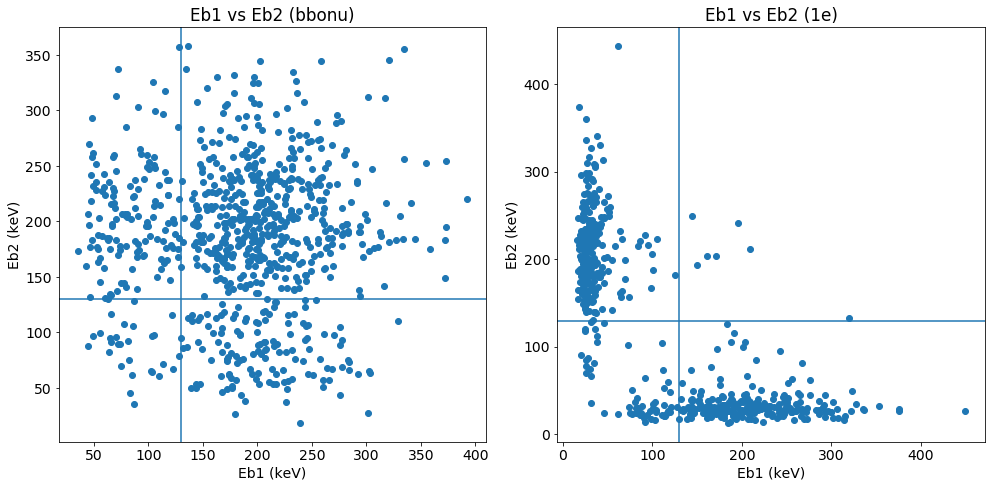

In [101]:
blob_energy(sfbbx, sf1ex, eb_cut=130, figsize=(14,7))

Tightening the distance does not change much the efficiency for signal but improves background rejection 

### Effect of blob radius

#### Consider the case of a smaller blob radius

In [146]:
rb = 2

In [147]:
gtbb = gtrack_df(rbb.gtracks, rb)
gt1e = gtrack_df(r1e.gtracks, rb)

In [148]:
fbb, f1e = select_topology_and_energy(gtbb,gt1e, energy_range=(2400, 2500))

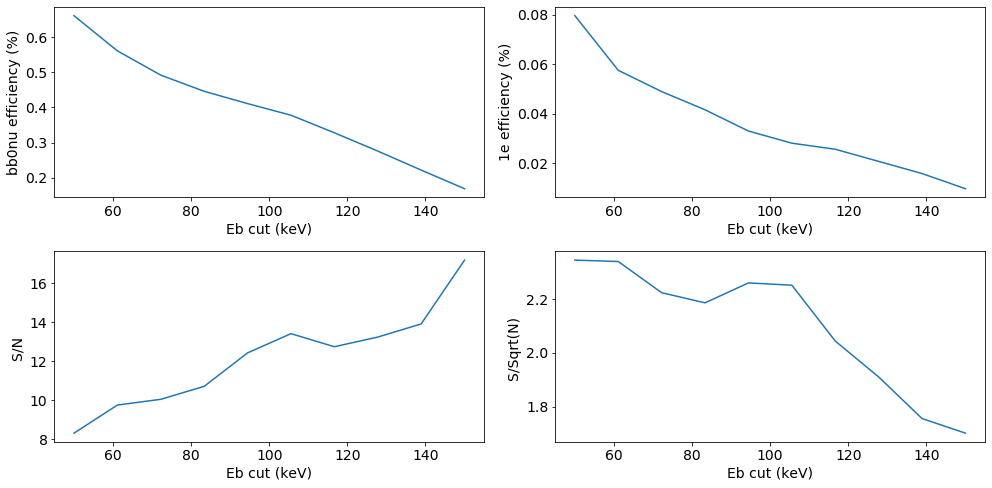

In [151]:
select_blobs_eff_energy(rbb, fbb, f1e, eb_range = (50, 150),  figsize=(14,7))

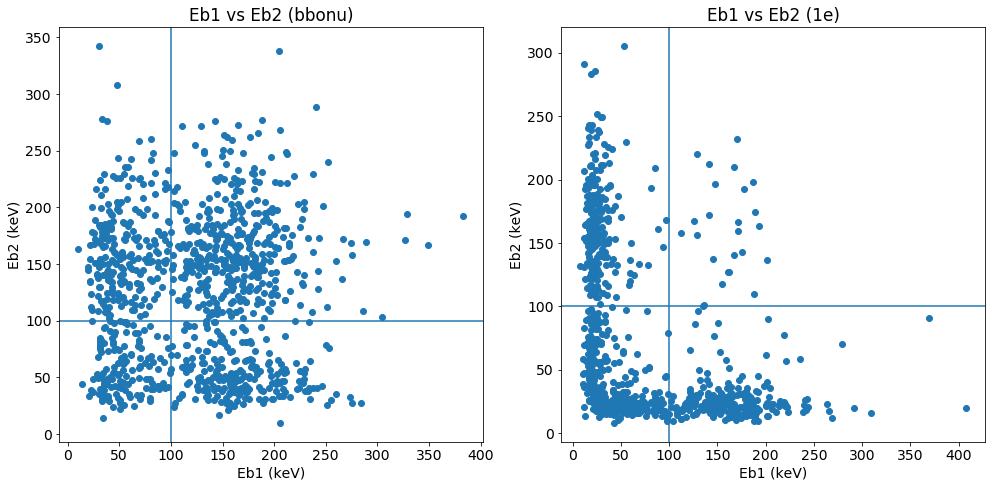

In [152]:
blob_energy(fbb, f1e, eb_cut=100, figsize=(14,7))

In [155]:
fbb2b, eff_2b_bb = select_two_blobs(fbb, eb_cut= 100)
fbb1e, eff_2b_1e = select_two_blobs(f1e, eb_cut= 100)

In [156]:
print(f"for bb0nu: 2b cut efficiency           = {eff_2b_bb:5.3f}")
print(f"for 1e: 2b cut efficiency              = {eff_2b_1e:5.3f}")

for bb0nu: 2b cut efficiency           = 0.393
for 1e: 2b cut efficiency              = 0.031


##### Not improvement

#### Larger blob radius

In [138]:
rb = 5

In [139]:
gtbb = gtrack_df(rbb.gtracks, rb)
gt1e = gtrack_df(r1e.gtracks, rb)

In [141]:
fbb, f1e = select_topology_and_energy(gtbb,gt1e, energy_range=(2400, 2500))

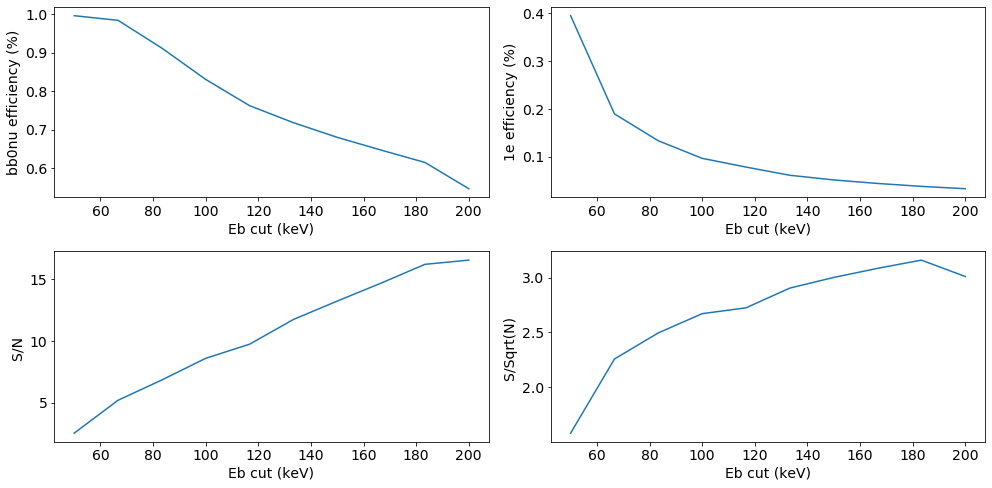

In [142]:
select_blobs_eff_energy(rbb, fbb, f1e, eb_range = (50,200),  figsize=(14,7))

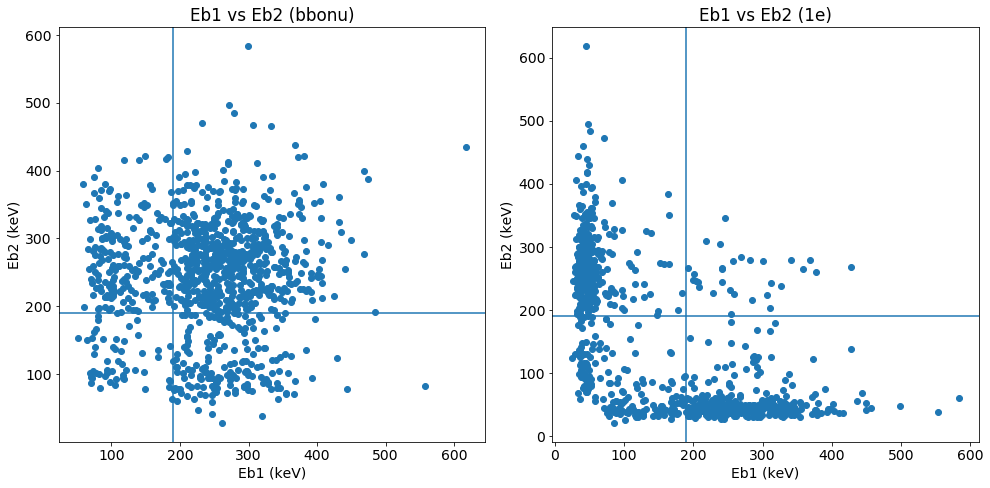

In [143]:
blob_energy(fbb, f1e, eb_cut=190, figsize=(14,7))

In [144]:
fbb2b, eff_2b_bb = select_two_blobs(fbb, eb_cut= 190)
fbb1e, eff_2b_1e = select_two_blobs(f1e, eb_cut= 190)

In [145]:
print(f"for bb0nu: 2b cut efficiency           = {eff_2b_bb:5.3f}")
print(f"for 1e: 2b cut efficiency              = {eff_2b_1e:5.3f}")

for bb0nu: 2b cut efficiency           = 0.588
for 1e: 2b cut efficiency              = 0.037


##### rb = 10 mm

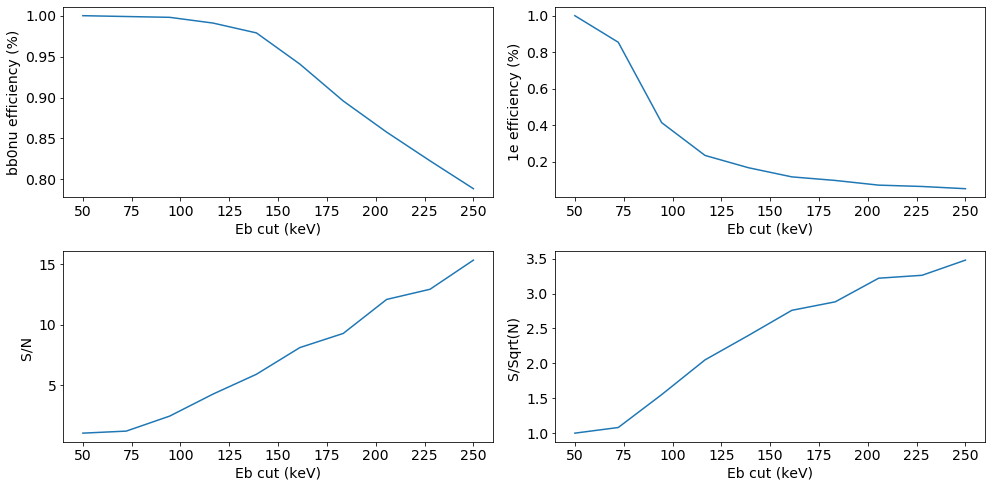

In [119]:
rb = 10
gtbb = gtrack_df(rbb.gtracks, rb)
gt1e = gtrack_df(r1e.gtracks, rb)
fbb, f1e = select_topology_and_energy(gtbb,gt1e, energy_range=(2400, 2500))

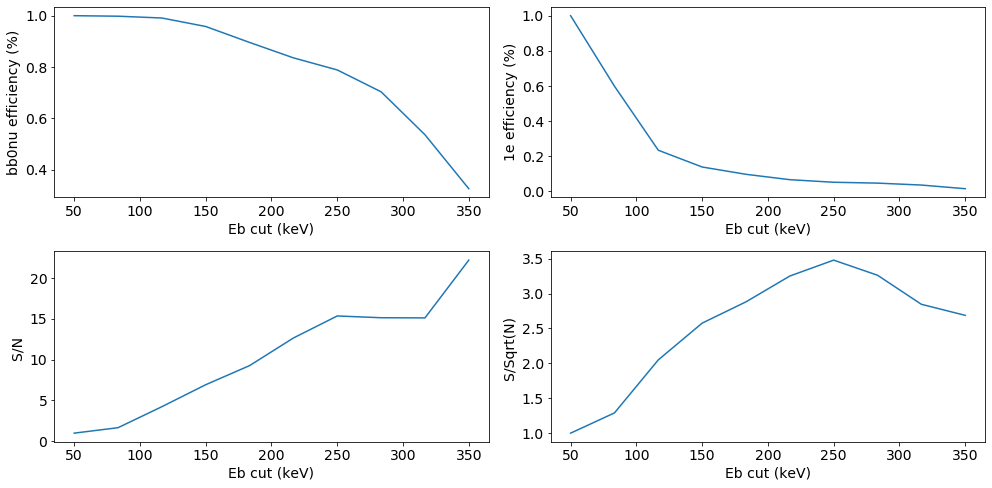

In [120]:
select_blobs_eff_energy(rbb, fbb, f1e, eb_range = (50,350),  figsize=(14,7))

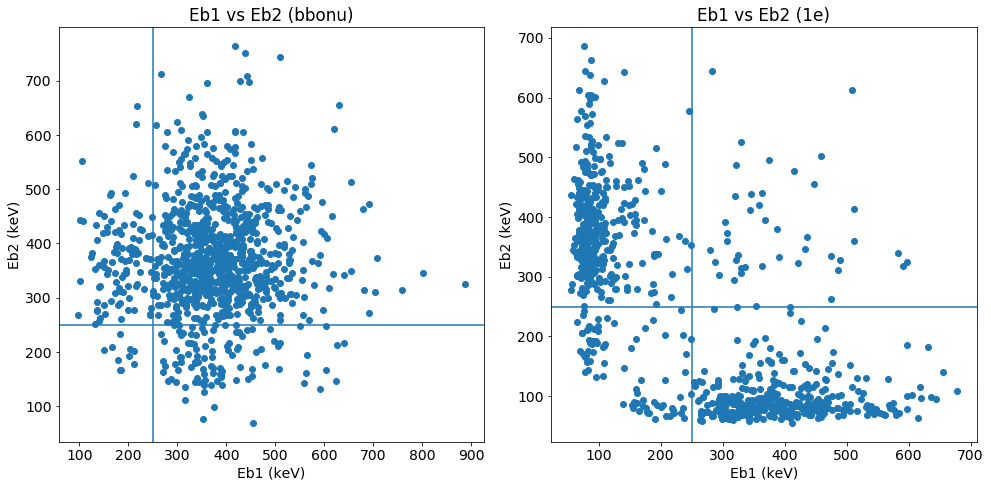

In [121]:
blob_energy(fbb, f1e, eb_cut=250, figsize=(14,7))

In [123]:
fbb2b, eff_2b_bb = select_two_blobs(fbb, eb_cut= 250)
fbb1e, eff_2b_1e = select_two_blobs(f1e, eb_cut= 250)
print(f"for bb0nu: 2b cut efficiency           = {eff_2b_bb:5.3f}")
print(f"for 1e: 2b cut efficiency              = {eff_2b_1e:5.3f}")

for bb0nu: 2b cut efficiency           = 0.789
for 1e: 2b cut efficiency              = 0.051


##### "Infinite granularity" has limited gains. "Best case" implies background suppression at the level of 1-3 % with efficiencies at the level of 30-50 %. 

### Interactive analysis

#### Single tracks

##### bb0nu

event id  = 213

        Reconstructed extrema:
        e1 = (-227.32716077051361, 279.15997426434643, 648.8205750108024) in mm
        e2 = (-243.28182983398438, 283.8463134765625, 702.2255249023438) in mm
        True extrema:
        t1 = [-227.31655884  279.18347168  648.78668213] in mm
        t2 = [-233.38461304  269.77822876  709.34716797] in mm
        Distance true-reco:
        d1 =   0.0     in mm
        d2 =  18.6     in mm
        Energy blobs:
        eb1 = 295.9 keV
        eb2 = 322.0 keV
        


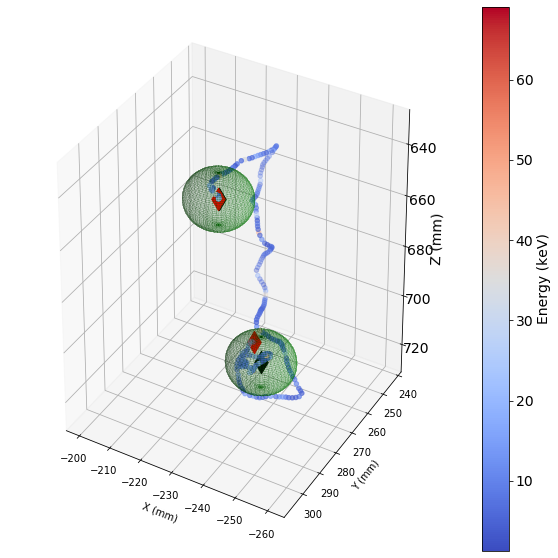

event id  = 214

        Reconstructed extrema:
        e1 = (-140.95742797851562, -68.06306457519531, 104.65027618408203) in mm
        e2 = (-115.3863475277067, -46.762389126379226, 63.949827600247545) in mm
        True extrema:
        t1 = [-140.50587463  -67.94478607  101.53165436] in mm
        t2 = [-115.28289032  -46.68539429   63.92531967] in mm
        Distance true-reco:
        d1 =   3.2     in mm
        d2 =   0.1     in mm
        Energy blobs:
        eb1 = 590.1 keV
        eb2 = 131.6 keV
        


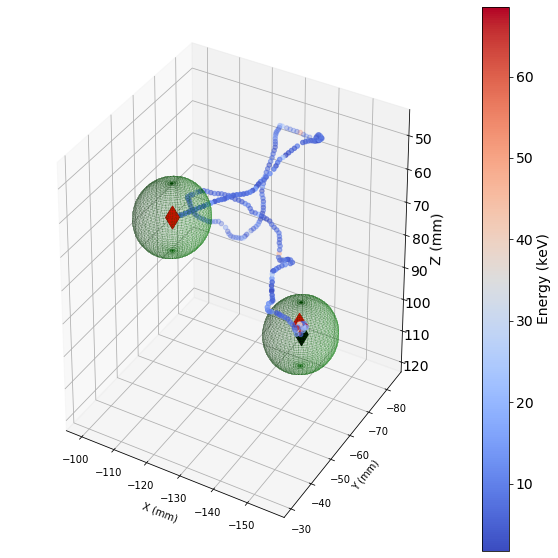

event id  = 215

        Reconstructed extrema:
        e1 = (-328.06982421875, -317.9634704589844, 1062.295166015625) in mm
        e2 = (-351.88610194973205, -301.6180813312744, 1087.9958147179743) in mm
        True extrema:
        t1 = [-333.07601929 -321.04690552 1052.43005371] in mm
        t2 = [-351.85073853 -301.66876221 1087.98913574] in mm
        Distance true-reco:
        d1 =  11.5     in mm
        d2 =   0.1     in mm
        Energy blobs:
        eb1 = 388.6 keV
        eb2 = 269.5 keV
        


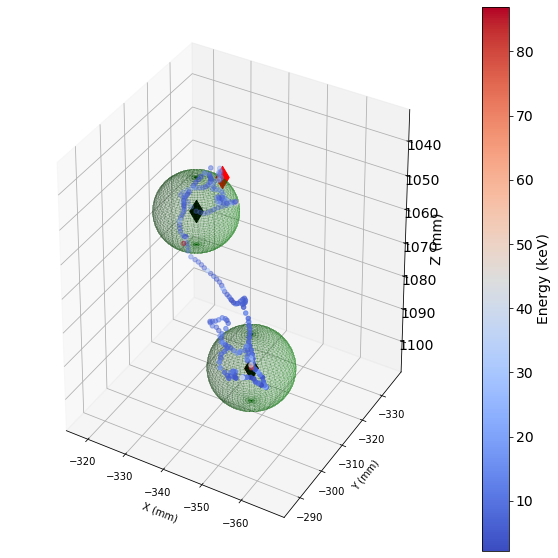

event id  = 173

        Reconstructed extrema:
        e1 = (166.76244392435748, 102.68545091665803, 538.8373457524342) in mm
        e2 = (175.18183434070949, 158.90553956224215, 475.56309209823115) in mm
        True extrema:
        t1 = [166.92436218 102.70442963 538.93029785] in mm
        t2 = [177.21934509 158.90208435 474.25280762] in mm
        Distance true-reco:
        d1 =   0.2     in mm
        d2 =   2.4     in mm
        Energy blobs:
        eb1 = 396.5 keV
        eb2 = 336.7 keV
        


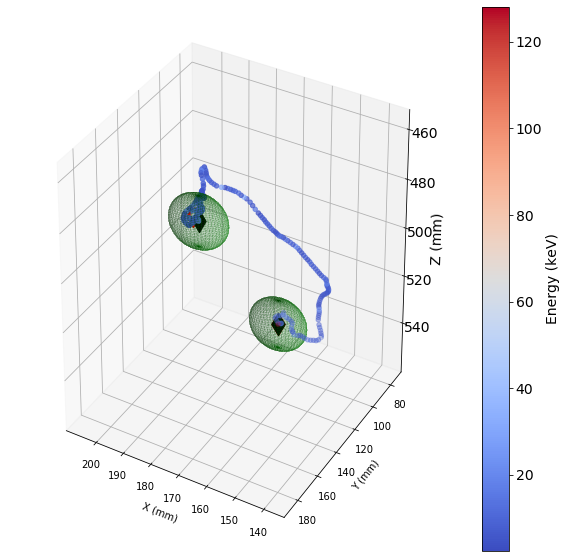

event id  = 174

        Reconstructed extrema:
        e1 = (152.2204411339676, 120.30761513371793, 733.0552637381874) in mm
        e2 = (238.57688517116367, 146.71606068851352, 729.4029665231216) in mm
        True extrema:
        t1 = [152.74171448 120.3971405  733.52459717] in mm
        t2 = [238.13180542 146.53588867 728.65368652] in mm
        Distance true-reco:
        d1 =   0.7     in mm
        d2 =   0.9     in mm
        Energy blobs:
        eb1 = 292.1 keV
        eb2 = 567.8 keV
        


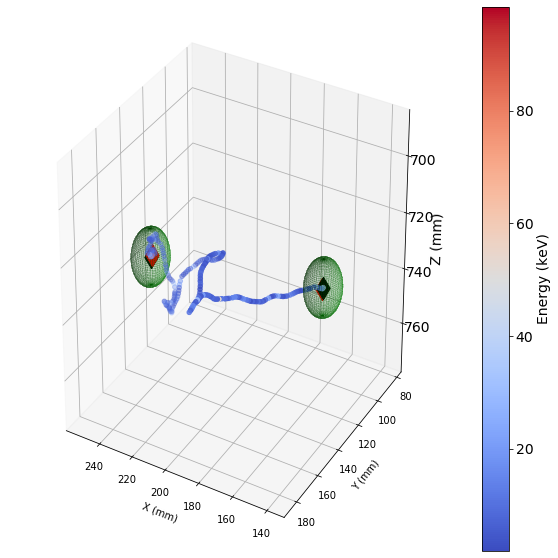

event id  = 4245

        Reconstructed extrema:
        e1 = (-269.3293120060219, -117.67237198470657, 1068.2091877997382) in mm
        e2 = (-255.7135009765625, -116.57636260986328, 1030.519287109375) in mm
        True extrema:
        t1 = [-268.60858154 -120.45092773 1067.78295898] in mm
        t2 = [-258.67672729 -117.63876343 1029.04833984] in mm
        Distance true-reco:
        d1 =   2.9     in mm
        d2 =   3.5     in mm
        Energy blobs:
        eb1 = 406.8 keV
        eb2 = 372.6 keV
        


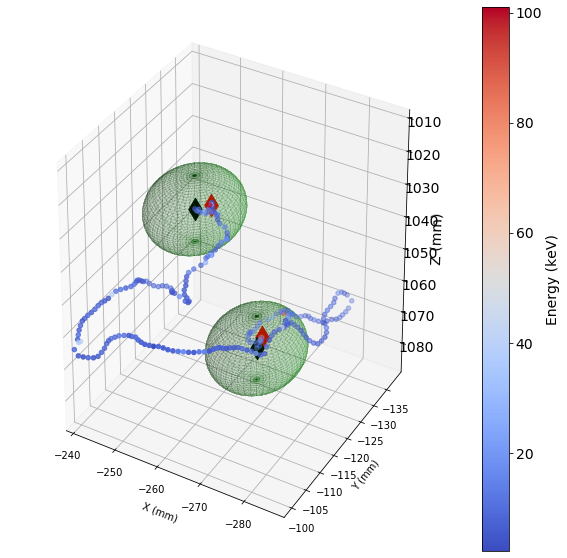

event id  = 4246

        Reconstructed extrema:
        e1 = (182.01252560577046, -48.618281460475906, 1147.1011293554297) in mm
        e2 = (208.30764770507812, -52.921714782714844, 1143.71923828125) in mm
        True extrema:
        t1 = [ 181.75436401  -48.72834015 1147.29760742] in mm
        t2 = [ 207.92175293  -51.18326569 1145.31726074] in mm
        Distance true-reco:
        d1 =   0.3     in mm
        d2 =   2.4     in mm
        Energy blobs:
        eb1 = 355.4 keV
        eb2 = 337.5 keV
        


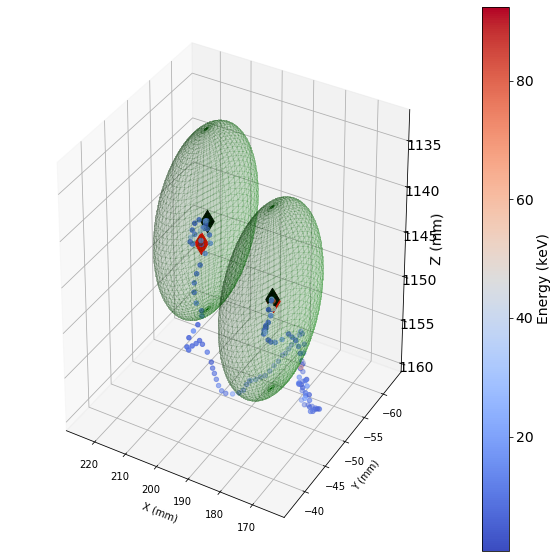

event id  = 4476

        Reconstructed extrema:
        e1 = (307.9560381307671, 218.63261023507658, 667.1208841890532) in mm
        e2 = (349.71432092411806, 191.1857796901636, 640.1328068997831) in mm
        True extrema:
        t1 = [307.57269287 218.54180908 667.0737915 ] in mm
        t2 = [349.70523071 191.04335022 640.23931885] in mm
        Distance true-reco:
        d1 =   0.4     in mm
        d2 =   0.2     in mm
        Energy blobs:
        eb1 = 318.6 keV
        eb2 = 377.4 keV
        


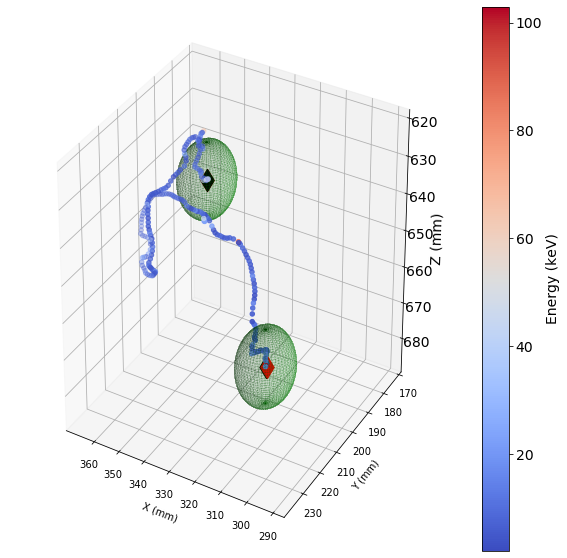

event id  = 4477

        Reconstructed extrema:
        e1 = (-454.5726511907419, 4.739196630735858, 204.3977913679818) in mm
        e2 = (-414.0929870605469, 14.382787704467773, 228.33851623535156) in mm
        True extrema:
        t1 = [-454.60287476    4.74366474  204.60333252] in mm
        t2 = [-413.49194336   16.77793503  229.81996155] in mm
        Distance true-reco:
        d1 =   0.2     in mm
        d2 =   2.9     in mm
        Energy blobs:
        eb1 = 274.5 keV
        eb2 = 580.1 keV
        


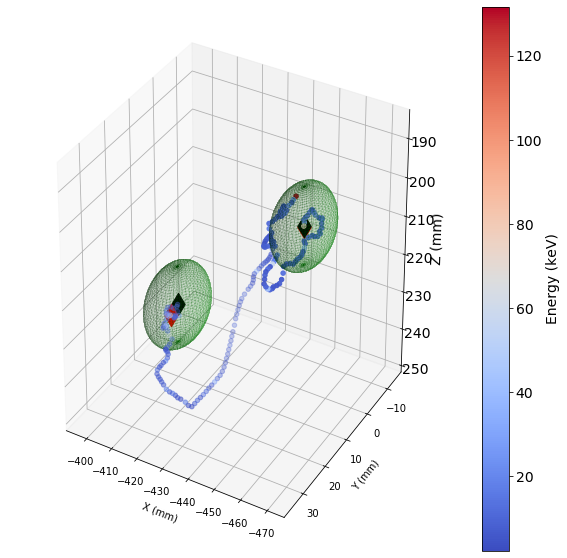

event id  = 4478

        Reconstructed extrema:
        e1 = (81.99116034497257, 188.731280836368, 1114.396563929269) in mm
        e2 = (140.6698311756582, 146.8541820758673, 1068.4964704566887) in mm
        True extrema:
        t1 = [  79.35450745  188.8547821  1117.39978027] in mm
        t2 = [ 140.51177979  146.56526184 1068.47607422] in mm
        Distance true-reco:
        d1 =   4.0     in mm
        d2 =   0.3     in mm
        Energy blobs:
        eb1 = 386.6 keV
        eb2 = 479.8 keV
        


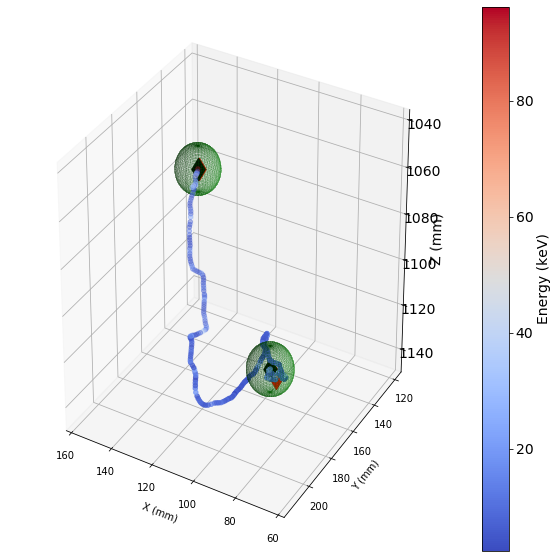

event id  = 4439

        Reconstructed extrema:
        e1 = (-330.2465995672725, 128.94104689954227, 248.1253514745133) in mm
        e2 = (-307.87884356824355, 49.09432914953652, 215.73205622522073) in mm
        True extrema:
        t1 = [-330.32632446  128.77017212  248.18583679] in mm
        t2 = [-302.84884644   52.64129257  216.46211243] in mm
        Distance true-reco:
        d1 =   0.2     in mm
        d2 =   6.2     in mm
        Energy blobs:
        eb1 = 337.7 keV
        eb2 = 367.8 keV
        


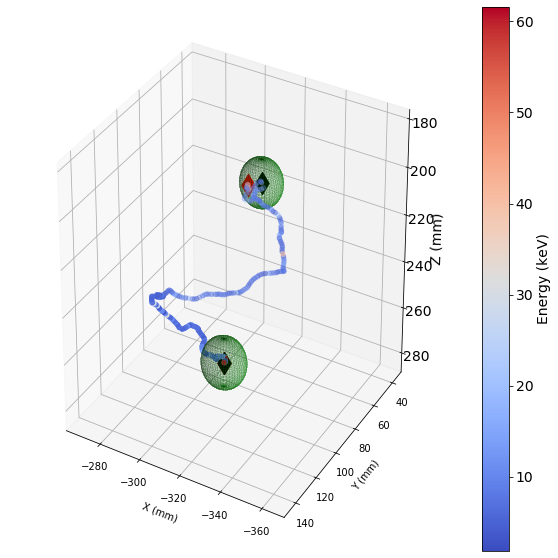

event id  = 493

        Reconstructed extrema:
        e1 = (77.76086909365691, -51.063352760867616, 257.1867890591093) in mm
        e2 = (104.29557133958738, -82.91111407884975, 278.41588081055426) in mm
        True extrema:
        t1 = [ 77.20832062 -50.27087784 257.15777588] in mm
        t2 = [104.25934601 -83.10865021 278.47442627] in mm
        Distance true-reco:
        d1 =   1.0     in mm
        d2 =   0.2     in mm
        Energy blobs:
        eb1 = 463.5 keV
        eb2 = 401.6 keV
        


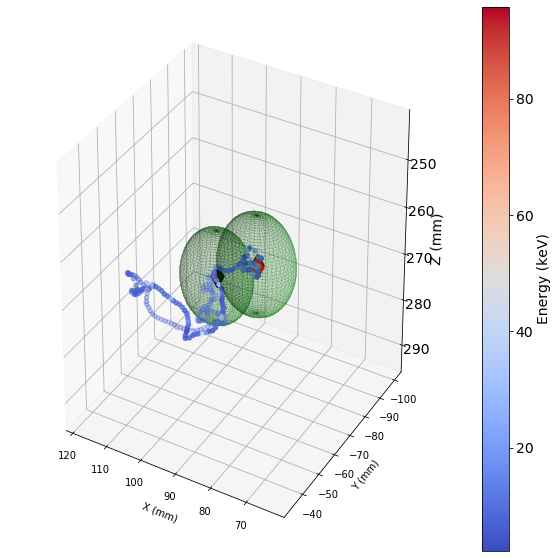

event id  = 494

        Reconstructed extrema:
        e1 = (-23.420347213745117, 288.1113586425781, 364.811279296875) in mm
        e2 = (-13.530310461431947, 352.4465870916983, 376.35926152457193) in mm
        True extrema:
        t1 = [-24.76200867 291.44180298 364.3934021 ] in mm
        t2 = [-13.54465103 352.48782349 376.41015625] in mm
        Distance true-reco:
        d1 =   3.6     in mm
        d2 =   0.1     in mm
        Energy blobs:
        eb1 = 407.5 keV
        eb2 = 574.4 keV
        


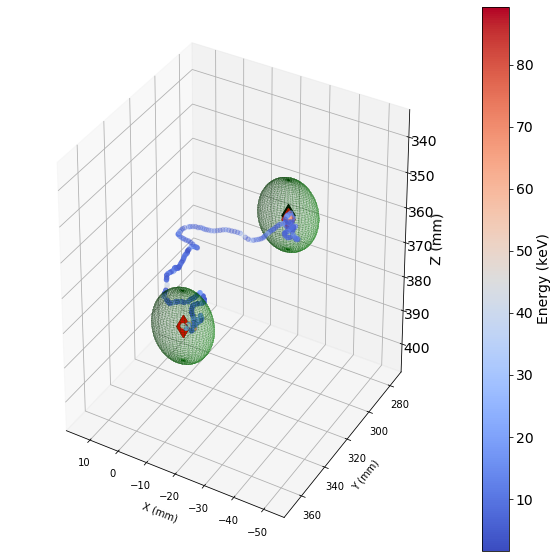

event id  = 981

        Reconstructed extrema:
        e1 = (-146.12974548339844, -138.5629119873047, 644.9607543945312) in mm
        e2 = (-117.90068817138672, -159.1618194580078, 647.7623901367188) in mm
        True extrema:
        t1 = [-145.66720581 -137.3155365   648.11578369] in mm
        t2 = [-117.21390533 -160.18040466  646.60498047] in mm
        Distance true-reco:
        d1 =   3.4     in mm
        d2 =   1.7     in mm
        Energy blobs:
        eb1 = 363.8 keV
        eb2 = 340.6 keV
        


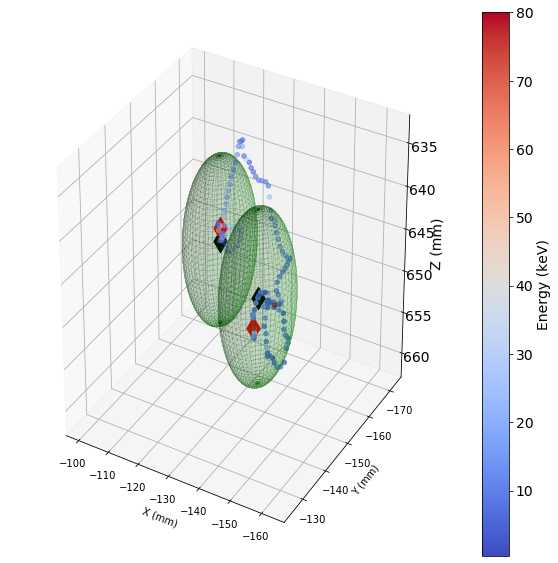

event id  = 983

        Reconstructed extrema:
        e1 = (-104.50555548644812, 429.0868945144181, 1047.5757173055422) in mm
        e2 = (-88.90477752685547, 391.53375244140625, 1063.18603515625) in mm
        True extrema:
        t1 = [-104.5284729   429.19235229 1047.62109375] in mm
        t2 = [ -85.89524078  394.59109497 1062.48937988] in mm
        Distance true-reco:
        d1 =   0.1     in mm
        d2 =   4.3     in mm
        Energy blobs:
        eb1 = 118.7 keV
        eb2 = 375.3 keV
        


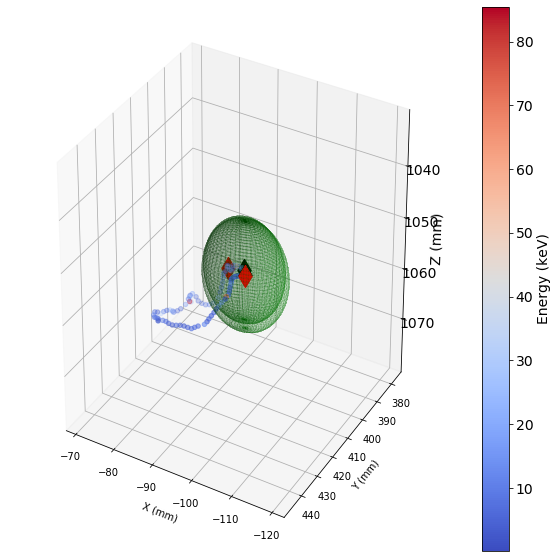

event id  = 10577

        Reconstructed extrema:
        e1 = (26.35314376944082, 438.9018930711191, 591.0116966552774) in mm
        e2 = (81.16336706862037, 453.264520777756, 570.2217563090812) in mm
        True extrema:
        t1 = [ 25.84429359 438.86288452 591.48931885] in mm
        t2 = [ 81.16358948 454.02722168 569.71203613] in mm
        Distance true-reco:
        d1 =   0.7     in mm
        d2 =   0.9     in mm
        Energy blobs:
        eb1 = 174.2 keV
        eb2 = 393.0 keV
        


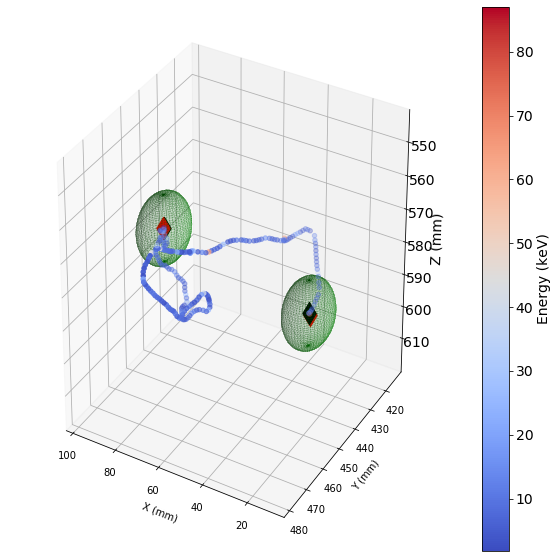

event id  = 10526

        Reconstructed extrema:
        e1 = (-246.8252718367812, -56.59562325115611, 34.71759349038471) in mm
        e2 = (-201.70954688660103, -140.25472912815377, 65.49720112060324) in mm
        True extrema:
        t1 = [-246.65061951  -56.30154037   34.73859406] in mm
        t2 = [-201.66397095 -140.14727783   65.44377899] in mm
        Distance true-reco:
        d1 =   0.3     in mm
        d2 =   0.1     in mm
        Energy blobs:
        eb1 = 320.2 keV
        eb2 = 357.1 keV
        


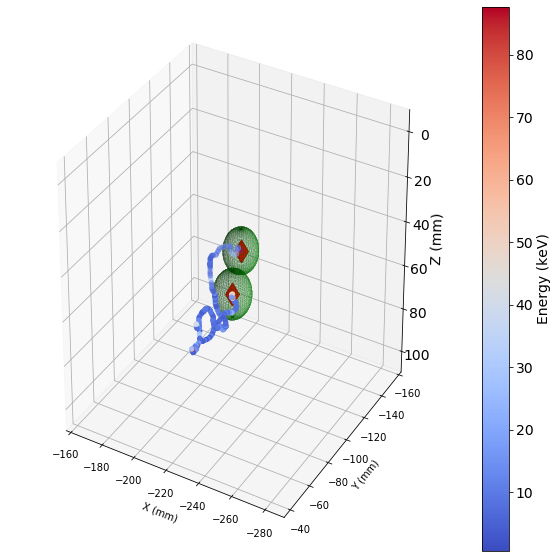

event id  = 10528

        Reconstructed extrema:
        e1 = (476.38091270798856, -122.8342818945753, 966.6904604753447) in mm
        e2 = (420.44362930308887, -111.7643604762463, 974.302282968016) in mm
        True extrema:
        t1 = [ 476.39825439 -122.833992    966.6918335 ] in mm
        t2 = [ 421.49932861 -111.63669586  973.38781738] in mm
        Distance true-reco:
        d1 =   0.0     in mm
        d2 =   1.4     in mm
        Energy blobs:
        eb1 = 360.3 keV
        eb2 =  78.9 keV
        


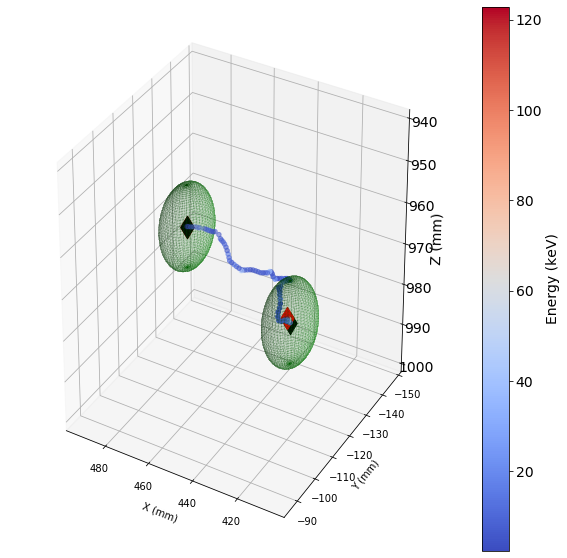

event id  = 10529

        Reconstructed extrema:
        e1 = (-261.21661376953125, 359.05743408203125, 1028.0499267578125) in mm
        e2 = (-330.41874405819794, 340.92158592885926, 1009.4499022948096) in mm
        True extrema:
        t1 = [-259.08255005  359.39257812 1027.83044434] in mm
        t2 = [-330.25421143  342.14776611 1009.96228027] in mm
        Distance true-reco:
        d1 =   2.2     in mm
        d2 =   1.3     in mm
        Energy blobs:
        eb1 = 401.8 keV
        eb2 = 325.9 keV
        


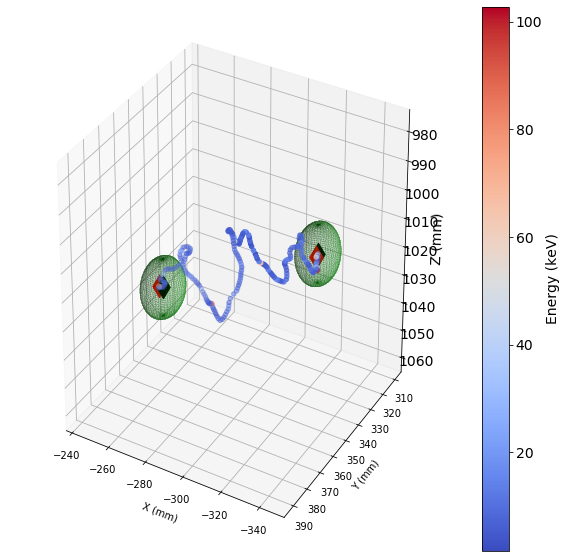

event id  = 10885

        Reconstructed extrema:
        e1 = (-116.53227233886719, -453.22711181640625, 850.5320434570312) in mm
        e2 = (-61.13918685913086, -421.91064453125, 881.5858764648438) in mm
        True extrema:
        t1 = [-116.29753113 -451.92825317  851.53961182] in mm
        t2 = [ -57.64123917 -433.9458313   885.71624756] in mm
        Distance true-reco:
        d1 =   1.7     in mm
        d2 =  13.2     in mm
        Energy blobs:
        eb1 = 333.0 keV
        eb2 = 214.4 keV
        


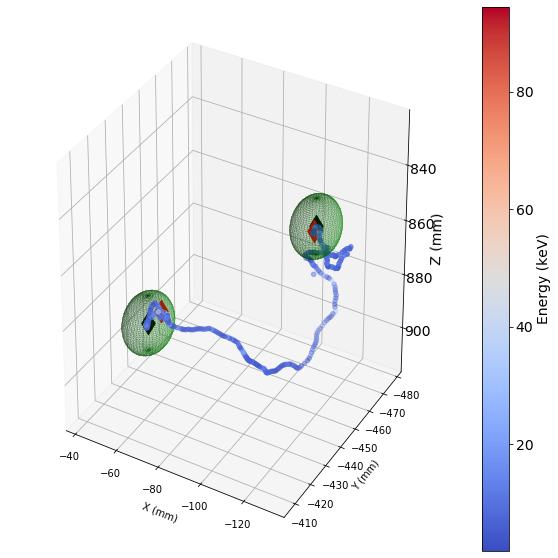

In [226]:
dbdf = single_track_interactive_analysis(rbb.gtracks, rbb.tExtrema, rbb_1t_rb_10, rb=10, 
                                  events_int = 20,
                                  figsize    = (10,10),
                                  fontsize   = 10)

In [227]:
dbdf

,event_id,eb1,eb2,db1,db2
0,213,295.923820,321.983887,0.042582,18.616759
1,214,590.065720,131.610509,3.153362,0.131272
2,215,388.641804,269.464162,11.484337,0.062159
3,173,396.491662,336.748012,0.187664,2.422459
4,174,292.072126,567.773707,0.707117,0.889932
...,...,...,...,...,...
1401,10864,177.625559,381.525596,30.050627,3.027725
1402,4872,257.049290,337.041575,1.387709,11.020249
1403,4874,287.966469,535.740537,4.947932,1.617637
1404,4875,286.761610,352.514114,0.319787,2.453939


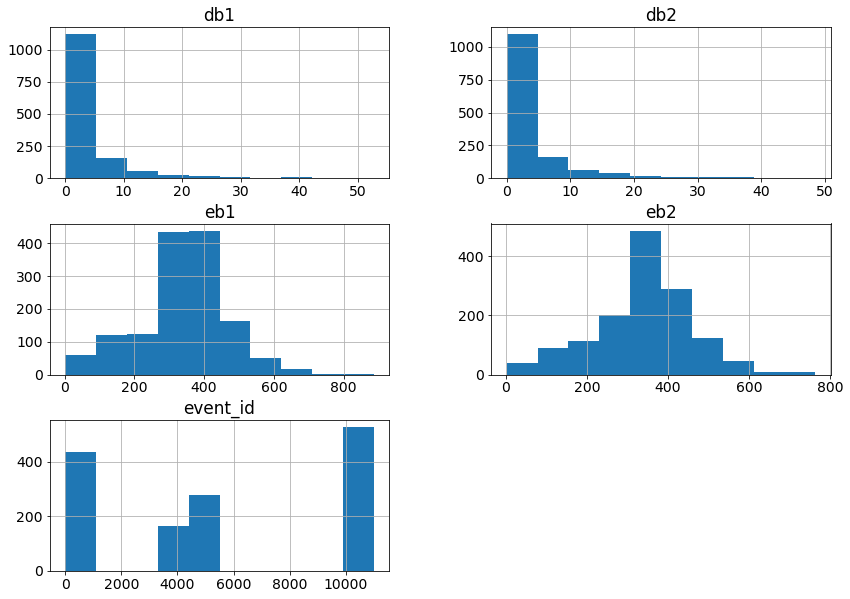

In [231]:
_= dbdf.hist(figsize=(14,10))

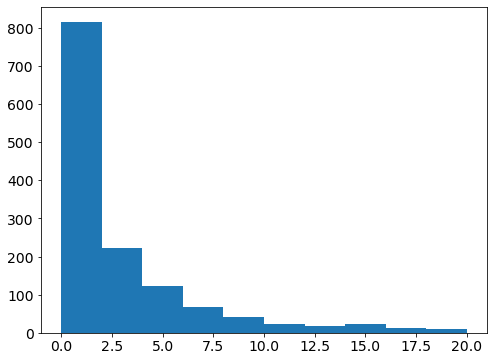

In [235]:
_= plt.hist(dbdf.db1, bins=10, range=(0,20))

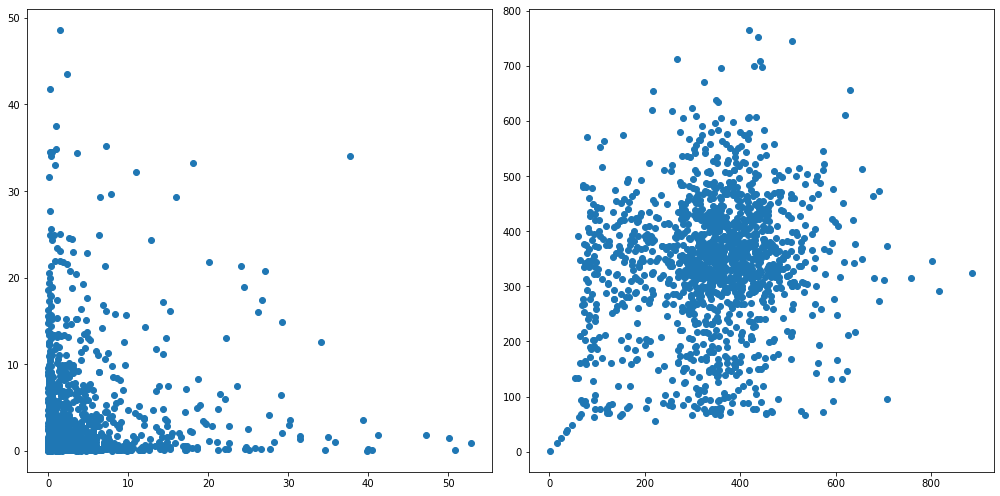

In [253]:
fig = plt.figure(figsize=(14,7))
ax  = fig.add_subplot(1, 2, 1)
plt.scatter(dbdf.db1, dbdf.db2)
ax1.set_xlim([0,50])
ax1.set_ylim([0,50])
ax  = fig.add_subplot(1, 2, 2)

plt.scatter(dbdf.eb1, dbdf.eb2)
ax1.set_xlim([0,50])
ax1.set_ylim([0,50])
plt.tight_layout()
plt.show()

In [239]:
db1df =dbdf[dbdf.db1 <25]
db2df =db1df[db1df.db2 <25]

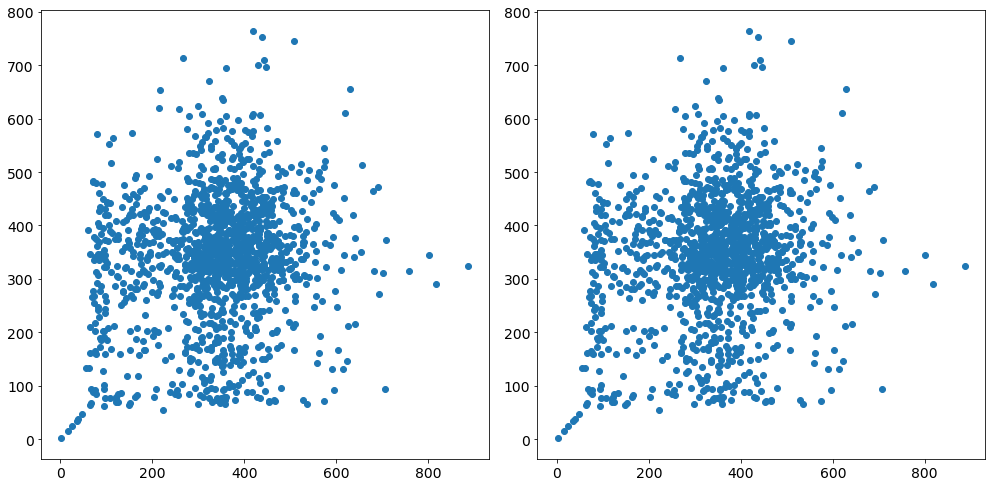

In [240]:
fig = plt.figure(figsize=(14,7))
ax  = fig.add_subplot(1, 2, 1)
plt.scatter(dbdf.eb1, dbdf.eb2)
ax1.set_xlim([0,50])
ax1.set_ylim([0,50])
ax  = fig.add_subplot(1, 2, 2)
plt.scatter(db2df.eb1, db2df.eb2)
ax1.set_xlim([0,50])
ax1.set_ylim([0,50])
plt.tight_layout()
plt.show()

event id  = 213


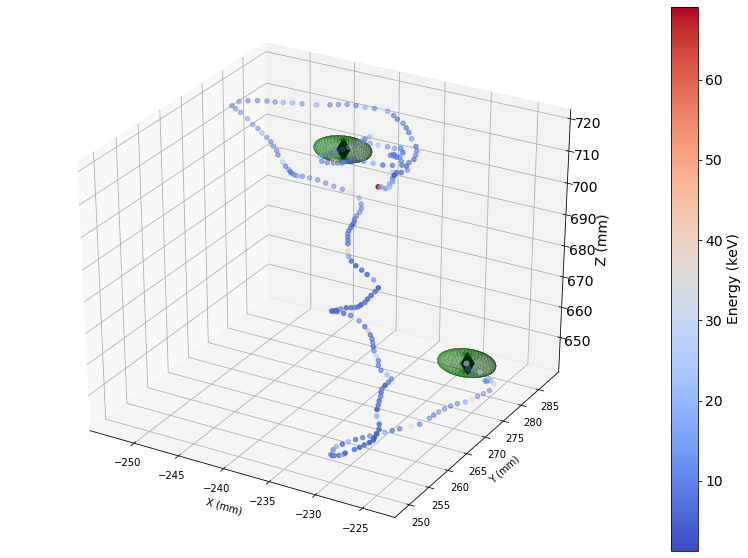

event id  = 214


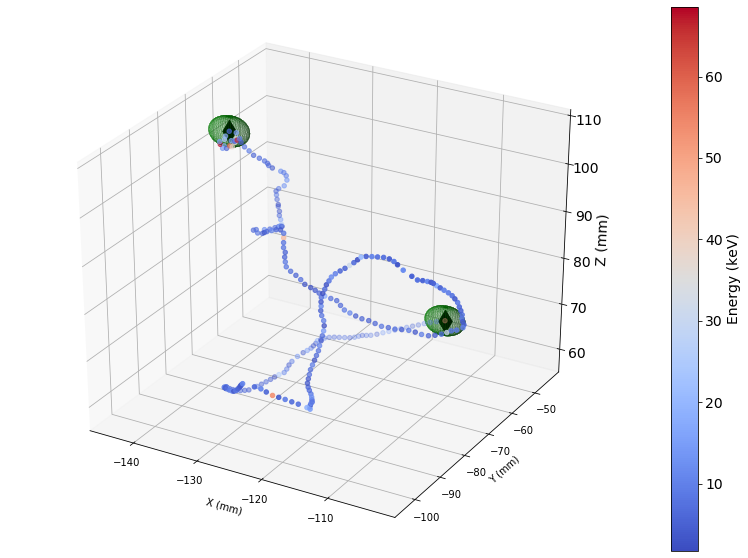

event id  = 215


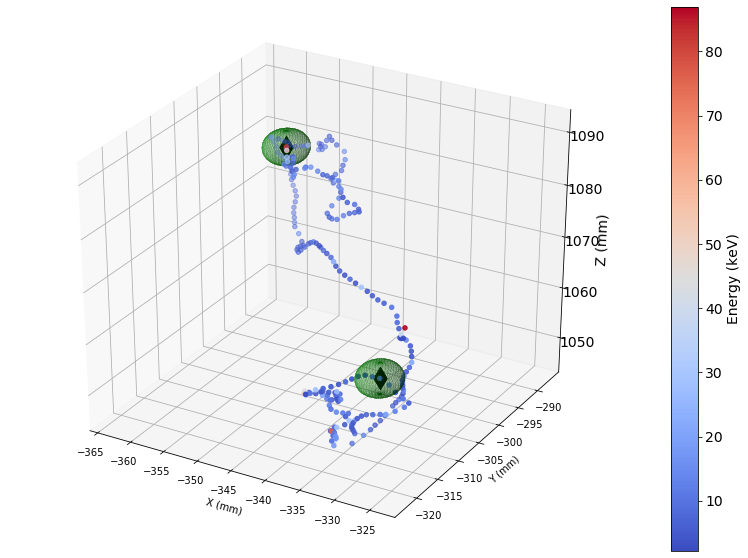

event id  = 173


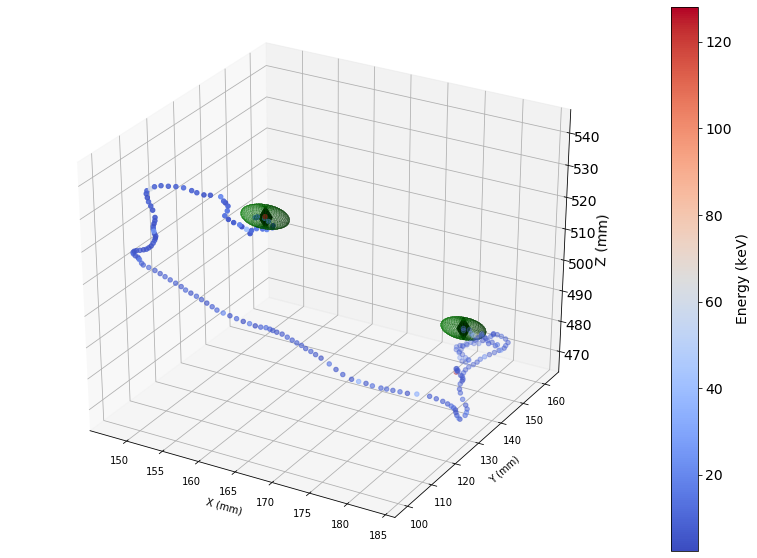

event id  = 174


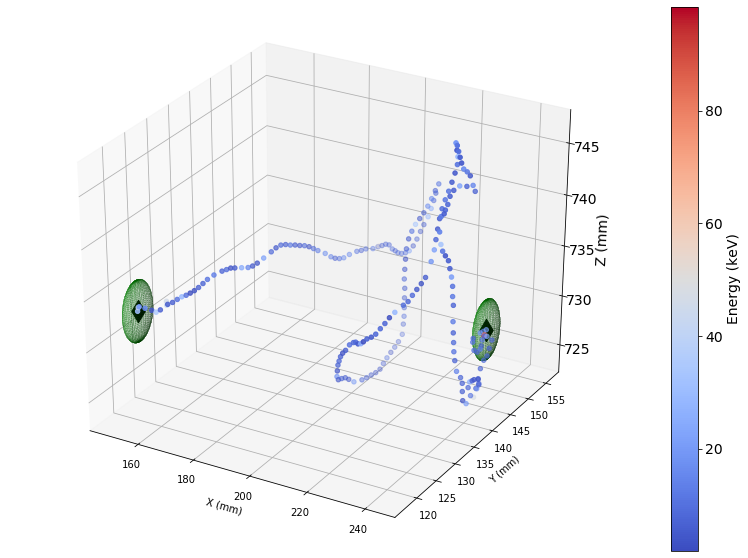

event id  = 4245


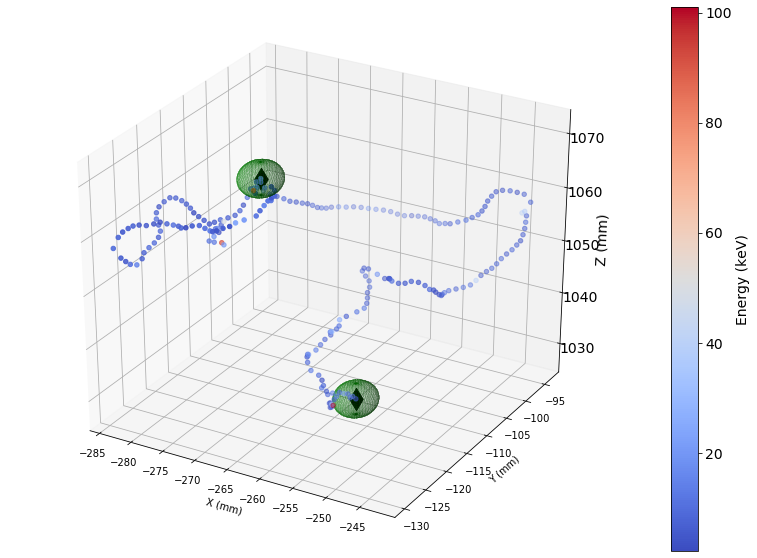

event id  = 4246


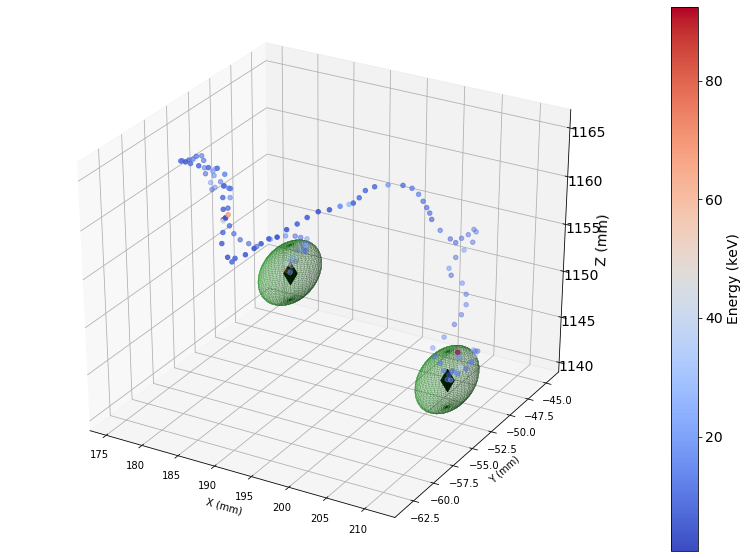

event id  = 4476


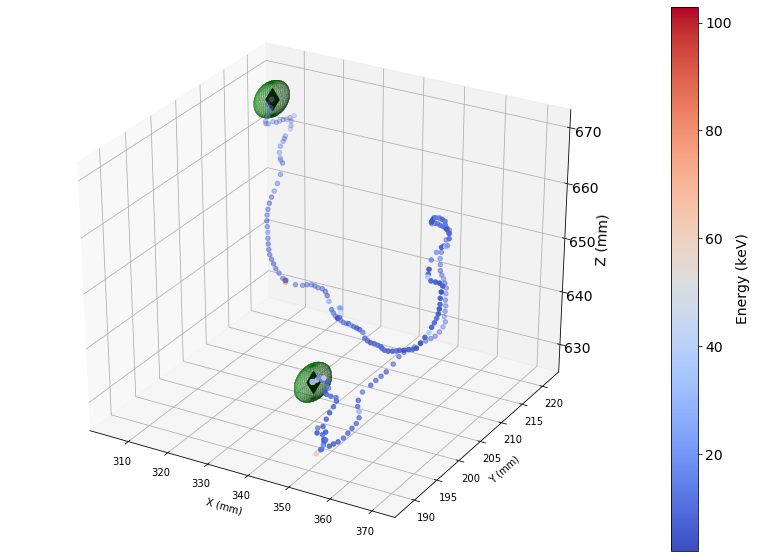

event id  = 4477


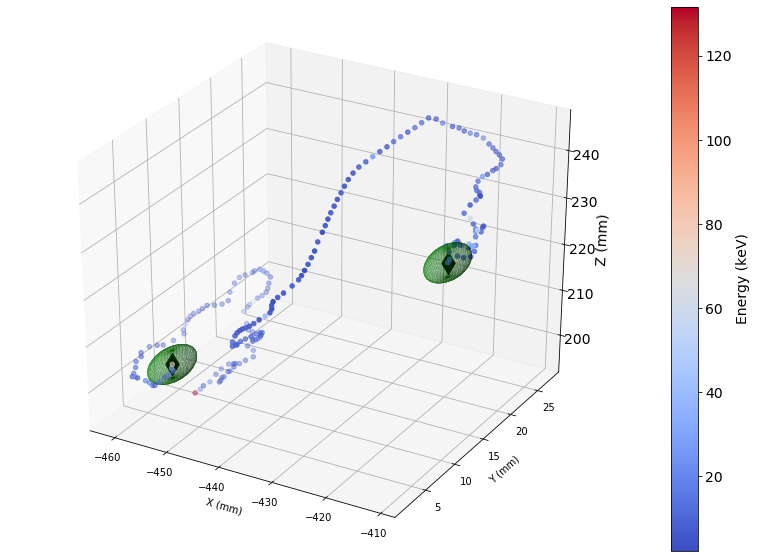

event id  = 4478


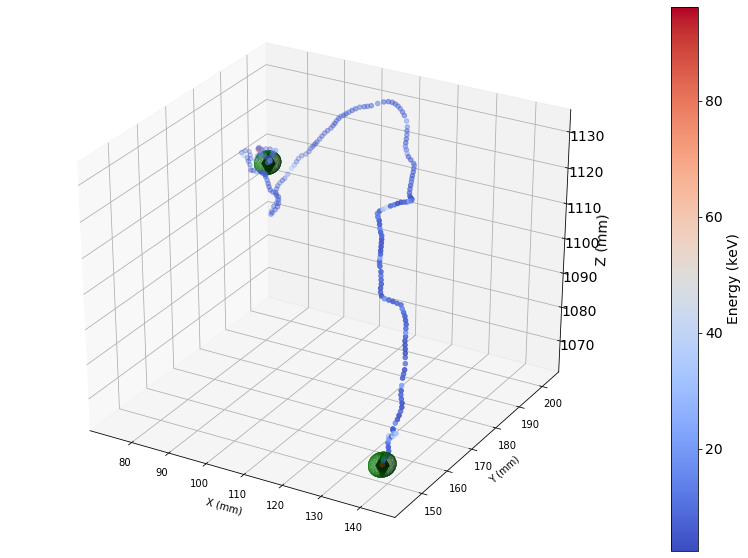

In [158]:
plot_single_tracks_list(rbb.gtracks, rbb_1t_rb_3, rb, 
                        nplots = 10, figsize = (14,10), fontsize=10)

##### single electrons

event id  = 10461


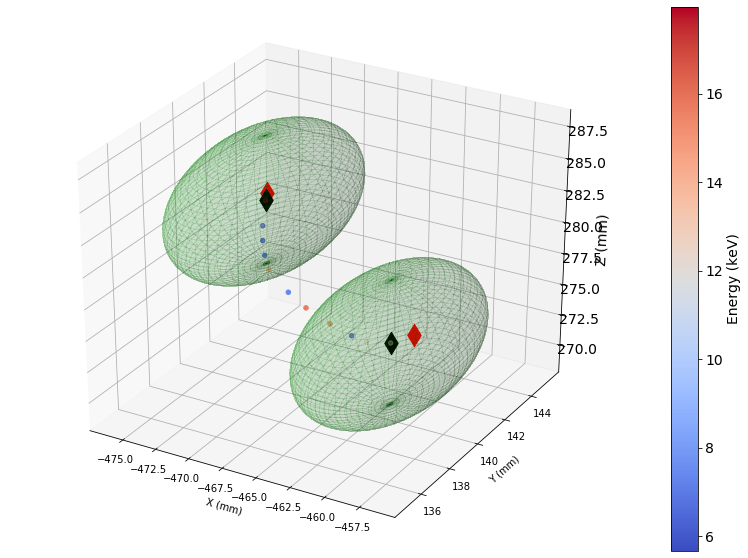

event id  = 10462


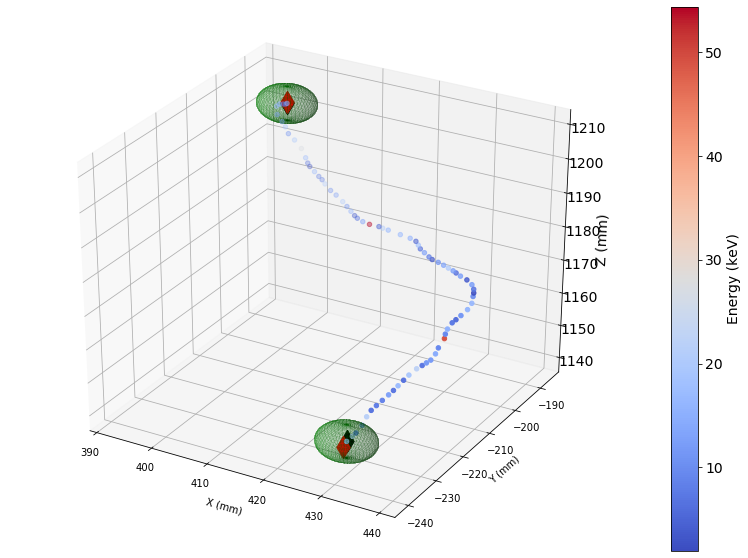

event id  = 10463


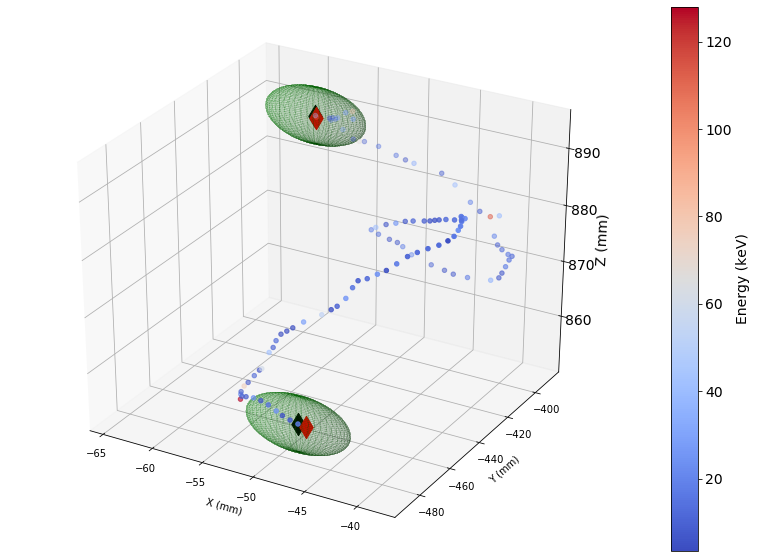

event id  = 10464


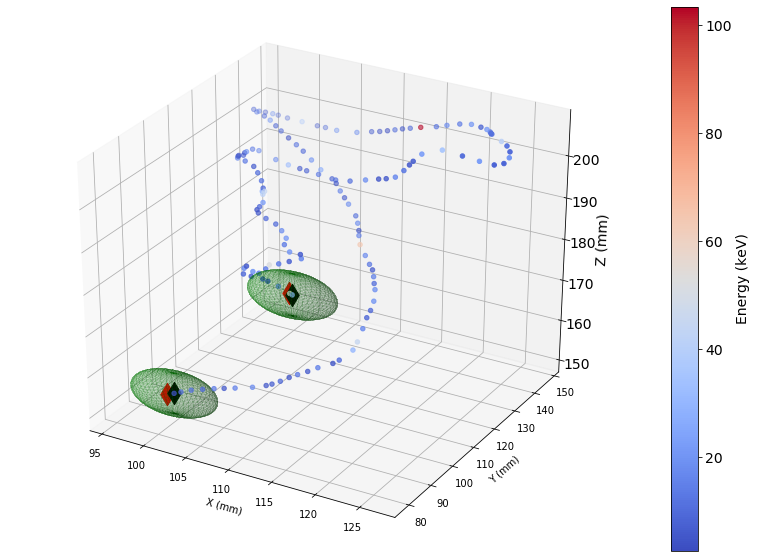

event id  = 1804


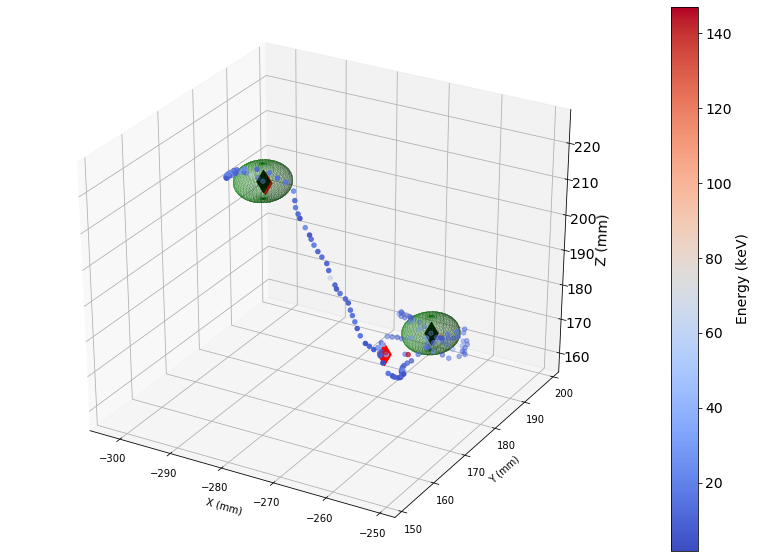

event id  = 5136


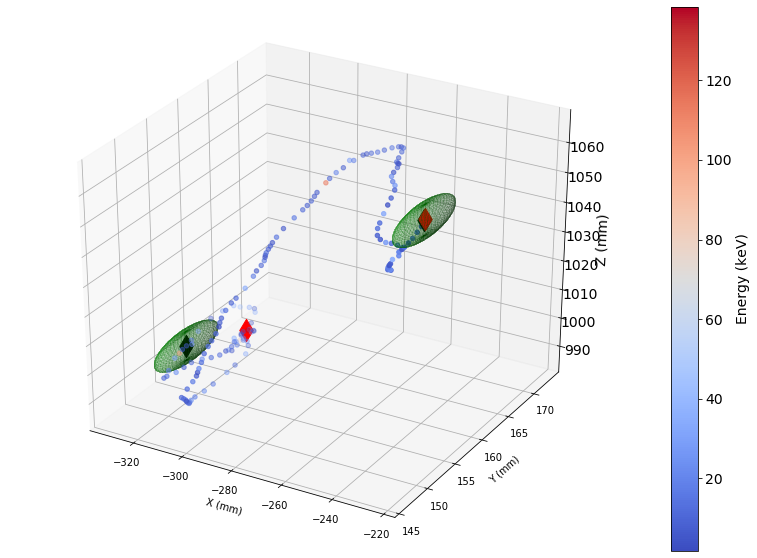

event id  = 5139


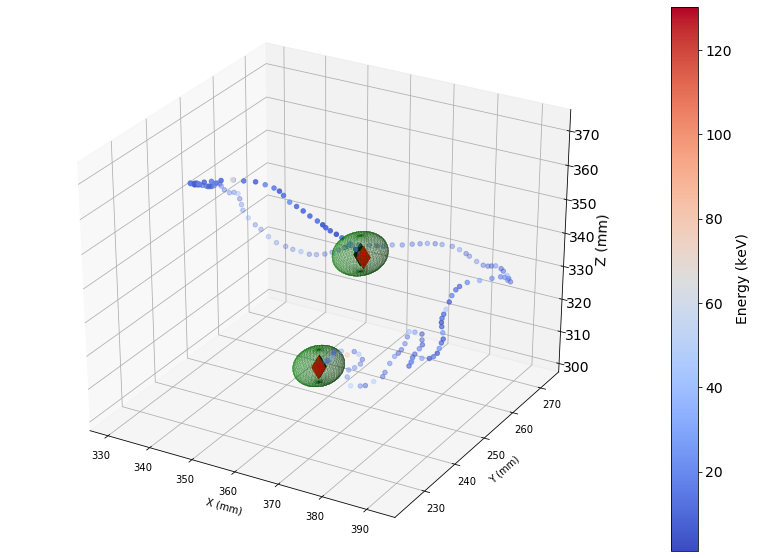

event id  = 5186


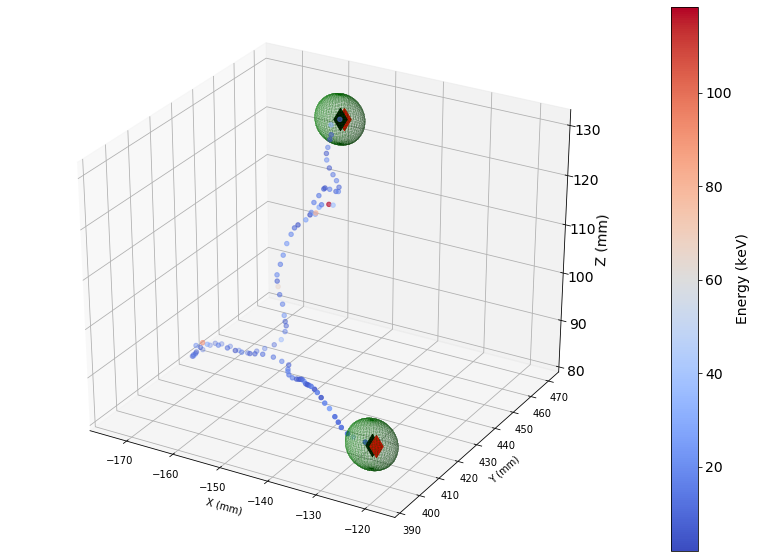

event id  = 5187


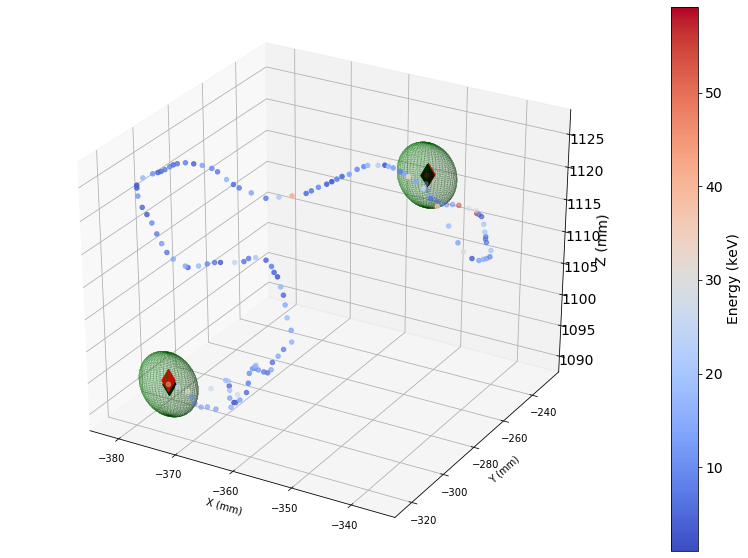

event id  = 5188


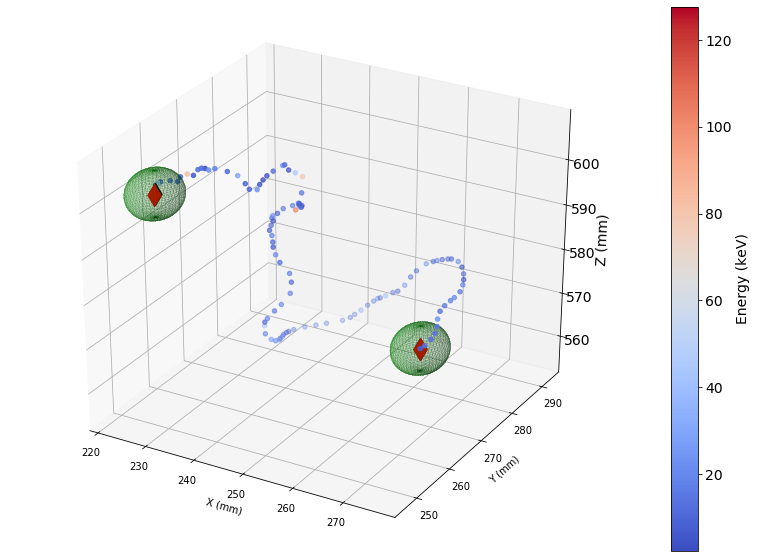

In [860]:
plot_single_tracks_list(r1e.gtracks, r1e_1t_rb_3, rb, 
                        r1e.tExtrema,
                        nplots = 10, figsize = (14,10), fontsize=10)

#### Multiple tracks

##### bb0nu

event number in gtEvent list  = 0


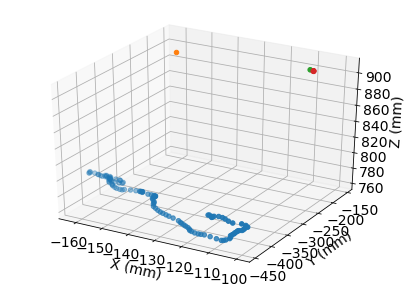

event number in gtEvent list  = 7


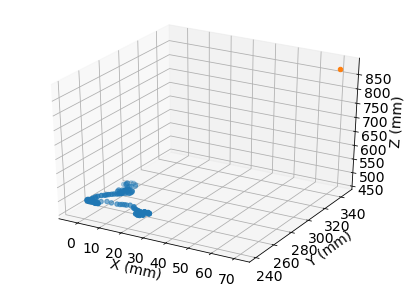

event number in gtEvent list  = 10


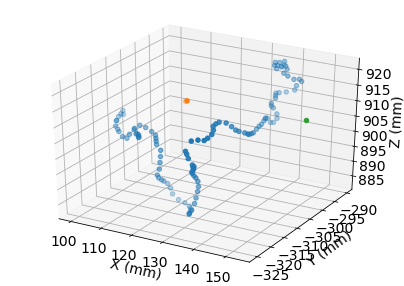

event number in gtEvent list  = 14


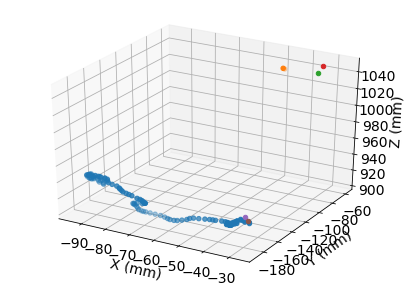

event number in gtEvent list  = 15


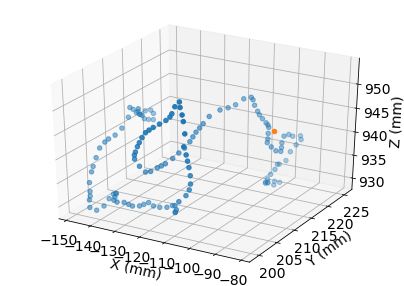

event number in gtEvent list  = 16


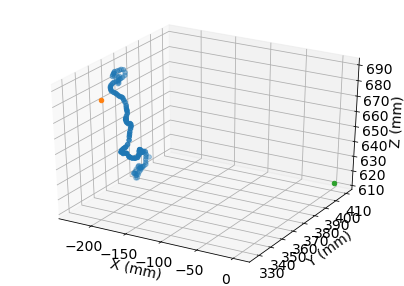

event number in gtEvent list  = 19


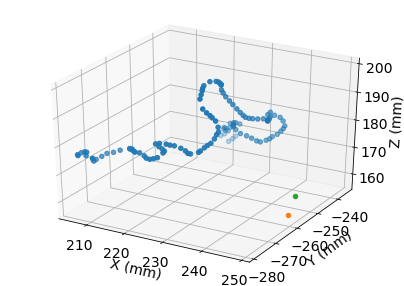

event number in gtEvent list  = 22


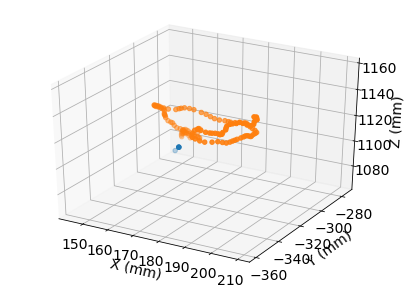

event number in gtEvent list  = 23


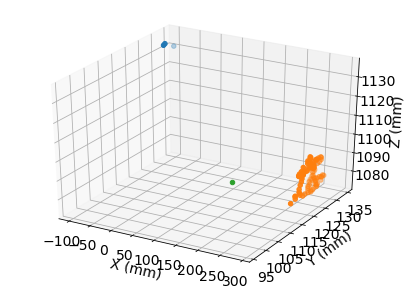

event number in gtEvent list  = 27


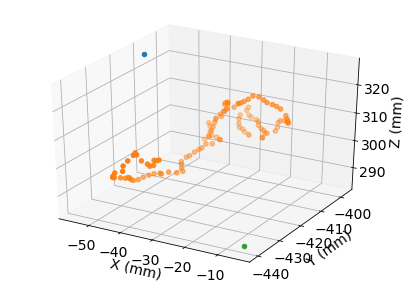

event number in gtEvent list  = 28


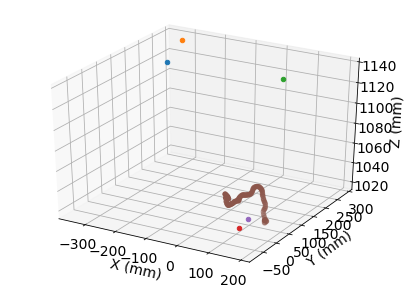

In [828]:
plot_multiple_tracks_list(rbb.gtracks, rbb_multi_rb_3, nplots=10, figsize = (7,5), fontsize=10)

##### Single electrons

event number in gtEvent list  = 0


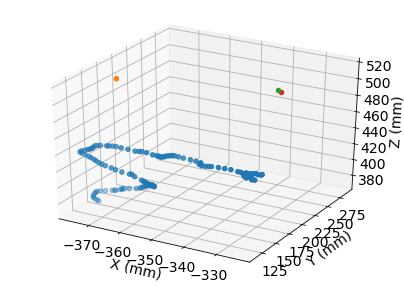

event number in gtEvent list  = 5


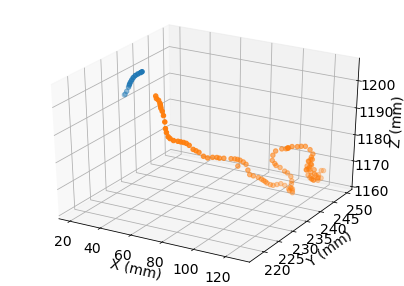

event number in gtEvent list  = 6


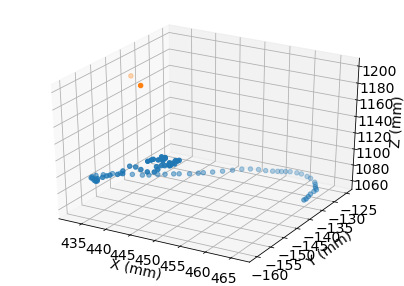

event number in gtEvent list  = 7


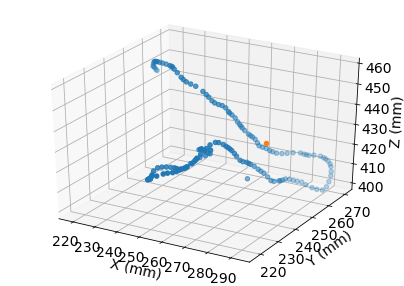

event number in gtEvent list  = 8


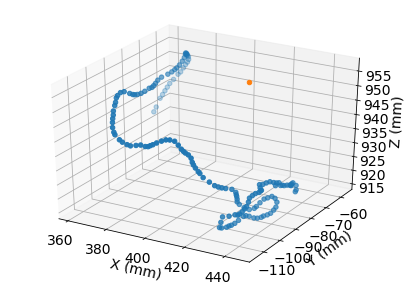

event number in gtEvent list  = 9


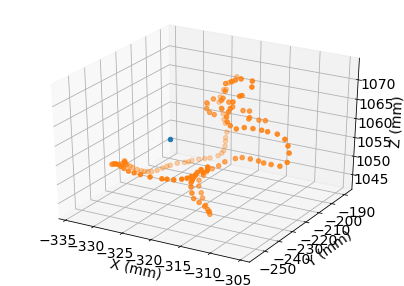

event number in gtEvent list  = 10


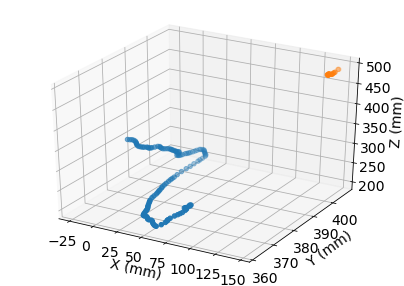

event number in gtEvent list  = 11


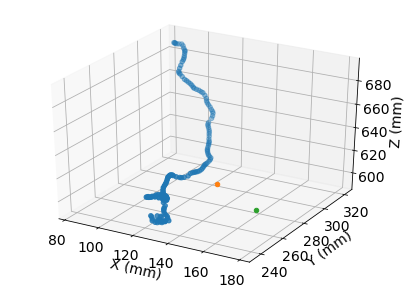

event number in gtEvent list  = 13


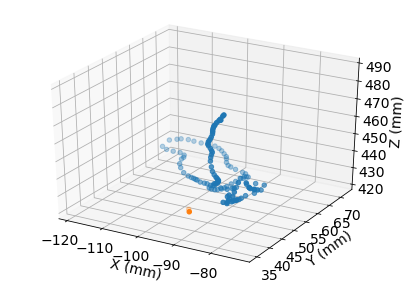

event number in gtEvent list  = 14


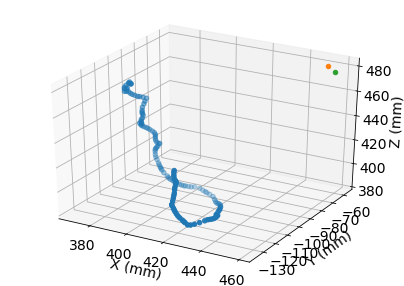

event number in gtEvent list  = 16


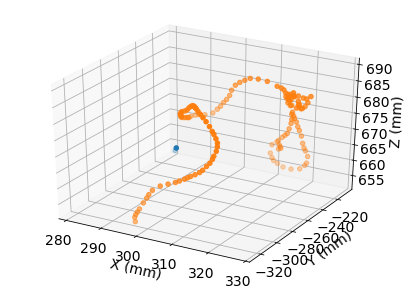

In [861]:
plot_multiple_tracks_list(r1e.gtracks, r1e_multi_rb_3, nplots=10, figsize = (7,5), fontsize=10)